In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['font.sans-serif'] = 'Arial'
sns.set_style('white', {'axes.grid' : False})

def vector(on=False):
    if on:
        sc.set_figure_params(dpi=50, dpi_save=300, vector_friendly=False)
    else:
        sc.set_figure_params(dpi=50, dpi_save=300, vector_friendly=True)
vector(False)

In [2]:
# cellbin plot

In [3]:
import sys
sys.path.append('/storage/liuyi/11.spaxcr//code')
import spaxcr

/home/liuyi/miniconda3/envs/spatial/lib/python3.9/site-packages/Bio/Application/__init__.py:39: BiopythonDeprecationWarning: The Bio.Application modules and modules relying on it have been deprecated.

Due to the on going maintenance burden of keeping command line application
wrappers up to date, we have decided to deprecate and eventually remove these
modules.

We instead now recommend building your command line and invoking it directly
with the subprocess module.
  warnings.warn(


<module 'spaxcr.process' from '/storage/liuyi/11.spaxcr//code/spaxcr/process/__init__.py'>

In [4]:
cellbin = sc.read_h5ad('/storage/liuyi/09.ma_tcr/bulid_meta/p7_umi/7-ZXH_LC.cellbin.h5ad')
bin50 = sc.read_h5ad('/storage/liuyi/09.ma_tcr/bulid_meta/p7_umi/7-ZXH_LC.bin50.h5ad')
rna = sc.read_h5ad('/storage/liuyi/09.ma_tcr/data_precoess/p7/m15_A0.clone.h5ad')

In [5]:
def combine_cellbin_binadata(cellbin_adata,bin_adata,obs,binsize = 50,basis = 'spatial'):
    rnaobs = bin_adata.obs.copy()
    rnaobs['x'] = bin_adata.obsm[basis][:,0]
    rnaobs['y'] = bin_adata.obsm[basis][:,1]
    rnaobs['id'] = rnaobs['x'].map(str) + '_' + rnaobs['y'].map(str) 
    match_dict = dict(zip(rnaobs['id'],rnaobs[obs]))
    cellbin_adataobs = cellbin_adata.obs.copy()
    cellbin_adataobs['id'] = (cellbin_adataobs['x']//binsize*binsize).astype(int).astype(str) + '_'+(cellbin_adataobs['y']//binsize*binsize).astype(int).astype(str)
    cellbin_adataobs['add'] = cellbin_adataobs['id'].map(match_dict)
    cellbin_adata.obs[obs] = cellbin_adataobs['add']

In [6]:
cellbin = spaxcr.pp.updatexcr(cellbin)
bin50 = spaxcr.pp.updatexcr(bin50)

Chain
> Update IGH-CDR3: 2554 → 2532
> Update IGK-CDR3: 2070 → 2068
> Update IGL-CDR3: 1080 → 1077
> Update TRA-CDR3: 378 → 378
> Update TRB-CDR3: 700 → 698

BCR Isotype:
>> Update IGHA-CDR3: 910 → 900
>> Update IGHG-CDR3: 1436 → 1435
>> Update IGHM-CDR3: 29 → 29
Chain
> Update IGH-CDR3: 7243 → 7243
> Update IGK-CDR3: 3592 → 3592
> Update IGL-CDR3: 2821 → 2821
> Update TRA-CDR3: 538 → 538
> Update TRB-CDR3: 1999 → 1999

BCR Isotype:
>> Update IGHA-CDR3: 3514 → 3514
>> Update IGHG-CDR3: 2913 → 2913
>> Update IGHM-CDR3: 67 → 67


In [7]:
clonefile = "/storage/fengyu/liuzhong/Mixcr_align/PE150_data_analyze/tmp/20240719/7-mix-combine/mixcr/7-mix-combine.contigs.tsv"
spaxcr.pp.addmutation(bin50,clonefile = clonefile)
spaxcr.pp.addmutation(cellbin,clonefile = clonefile)

# fig 3a

In [8]:
import random
color_list = ['#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99','#e31a1c','#fdbf6f','#ff7f00','#cab2d6','#6a3d9a']
random.shuffle(color_list) 
rna.uns['annotation2_colors'] = color_list

In [40]:
rna.uns['annotation2_colors'] = [ '#fdb462',
 '#bebada',
 '#ffffb3',
 '#b3de69',
 '#d9d9d9',
 '#8dd3c7',
 '#fccde5',
 '#bc80bd',
 '#fb8072',
 '#80b1d3']

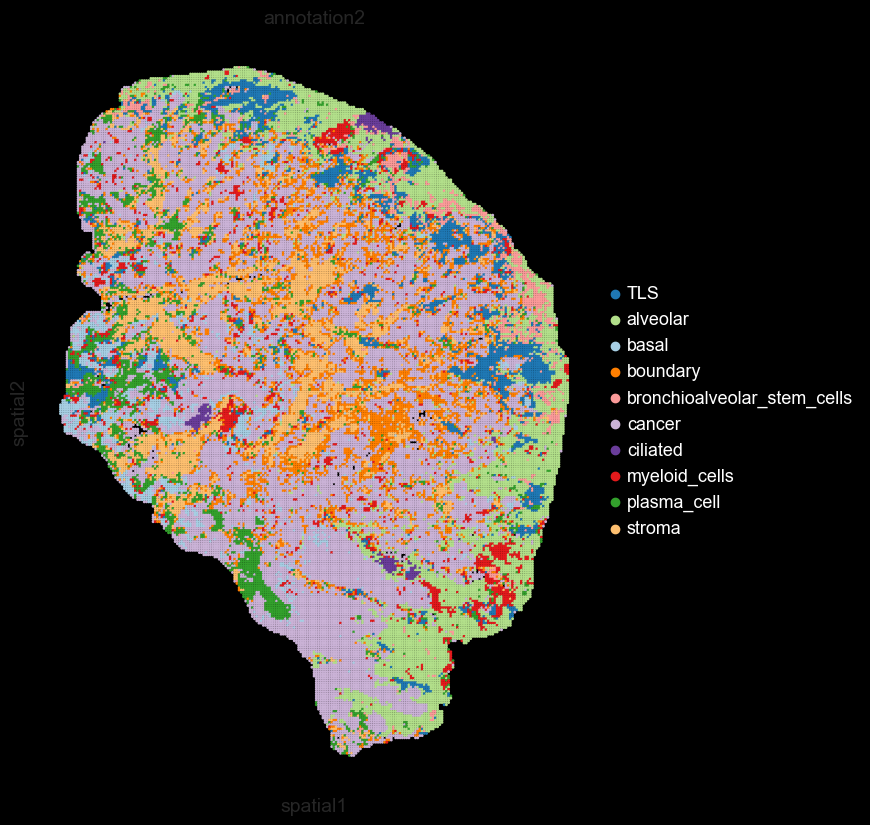

In [52]:
rna = sc.read_h5ad('/storage/liuyi/09.ma_tcr/data_precoess/p7/m15_A0.clone.h5ad')
color_list = ['#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99','#e31a1c','#fdbf6f','#ff7f00','#cab2d6','#6a3d9a']
# random.shuffle(color_list) 
rna.uns['annotation2_colors'] = color_list

fig,ax = plt.subplots(figsize = (10,10))
fig.patch.set_facecolor('black')
ax.set_facecolor('black')
sc.pl.spatial(rna,color = 'annotation2',spot_size = 65,show = False,ax = ax)
legend = ax.get_legend()
if legend:
    for text in legend.get_texts():
        text.set_color("white")
fig.savefig('./Main_figure/Fig3A.pdf',bbox_inches = 'tight')

# figure 3b

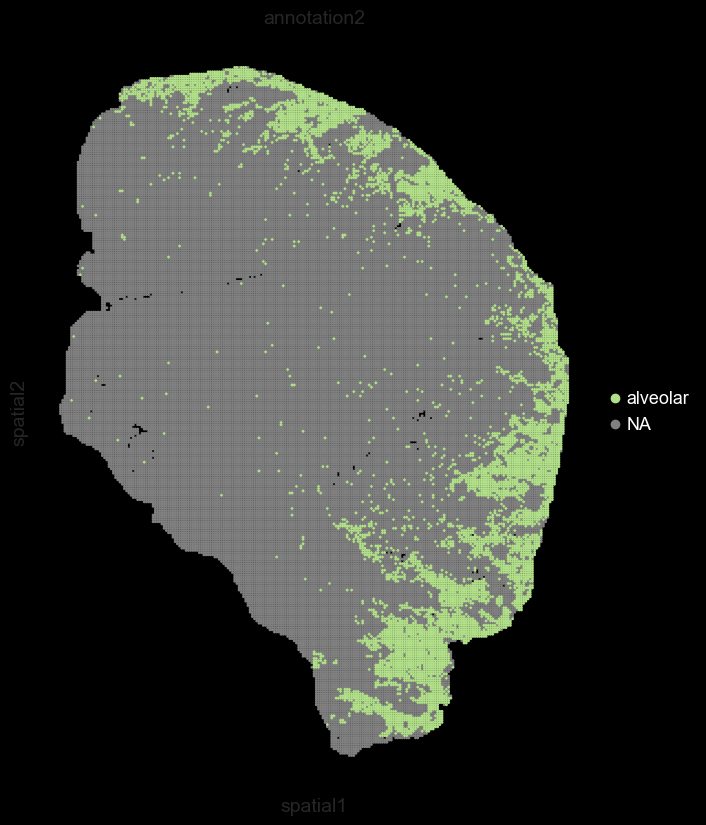

In [56]:
fig,ax = plt.subplots(figsize = (10,10))
fig.patch.set_facecolor('black')
ax.set_facecolor('black')
sc.pl.spatial(rna,color = 'annotation2',groups = 'alveolar',spot_size = 65,show = False,ax = ax,na_color = '#606266')
legend = ax.get_legend()
if legend:
    for text in legend.get_texts():
        text.set_color("white")
fig.savefig('./Main_figure/Fig3B.pdf',bbox_inches = 'tight')

# figure 3c

In [8]:
rna.obs['x'] = list(rna.obsm['X_spatial'][:,0])
rna.obs['y'] = list(rna.obsm['X_spatial'][:,1])

In [11]:
adata = rna
expandeadata = adata[adata.obs[f'annotation2'] == 'TLS'].copy()
clonedf = expandeadata.obs.copy()
cdr3loc = clonedf[['x','y']].values
from sklearn.neighbors import KDTree
tree = KDTree(cdr3loc)
query = tree.query(cdr3loc, k = 150)
meandistance = query[0].mean(axis=1)
expandeadata.obs[f'clean'] = (meandistance < np.median(meandistance)).reshape(-1,1)
adata.obs[f'redunoise'] = (adata.obs_names.isin(expandeadata[expandeadata.obs['clean']].obs_names)).astype(str)
from sklearn.cluster import DBSCAN
subadata = adata[adata.obs['redunoise'] == 'True']
coordinates = subadata.obs[['x','y']].values
dbscan = DBSCAN(eps = 300, min_samples = 5) 
subadata.obs['cluster'] = dbscan.fit_predict(coordinates)

adata.obs['tls_cluster'] = subadata.obs['cluster'].astype(str)
rna.obs['tls_cluster'] = adata.obs['tls_cluster']

/tmp/ipykernel_2977734/1994099512.py:15: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  subadata.obs['cluster'] = dbscan.fit_predict(coordinates)


In [15]:
# rna.write('tls.h5ad')

In [12]:
rna = sc.read_h5ad('tls.h5ad')

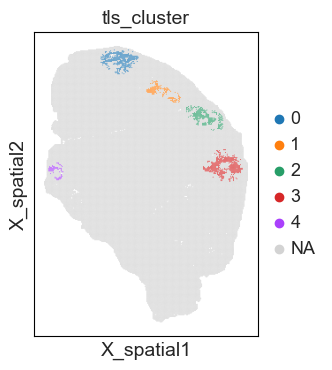

In [10]:
sc.pl.spatial(rna,color = 'tls_cluster',basis = 'X_spatial',spot_size = 50)

In [13]:
hull = cellbin.uns['hull']

In [14]:
from sklearn.neighbors import KDTree


In [15]:
points = rna[rna.obs['annotation2'] == 'alveolar'].obsm['X_spatial']
plotx = points[:,0]
ploty = points[:,1]

In [16]:
rawpoints = rna[rna.obs['annotation2'] == 'alveolar'].obsm['X_spatial']
tree = KDTree(rawpoints)
query = tree.query(rawpoints, k = 5)
meandistance = query[0].mean(axis=1)
mask = (meandistance < np.percentile(meandistance,95))
points = rawpoints[mask, :]

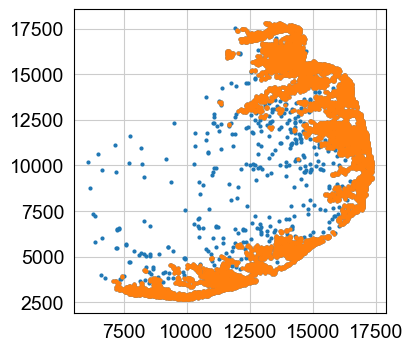

In [17]:
plt.plot(rawpoints[:,0], rawpoints[:,1], 'o', label='raww', markersize=2)

plt.plot(points[:,0], points[:,1], 'o', label='new', markersize=2)


In [18]:
import concave_hull
tmphull = concave_hull.concave_hull(points,concavity = 0.2)

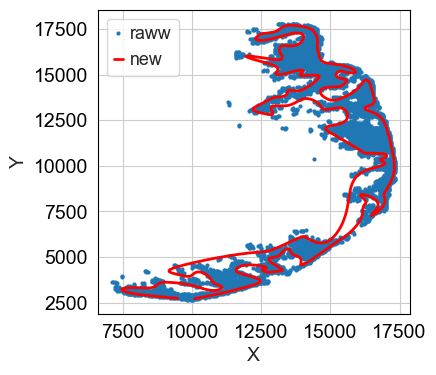

In [19]:
from skimage.measure import find_contours
from scipy.ndimage import gaussian_filter1d
import matplotlib.pyplot as plt

x, y = tmphull[:, 0], tmphull[:, 1]
x_smooth = gaussian_filter1d(x, sigma = 10)
y_smooth = gaussian_filter1d(y, sigma=10)
plt.plot(points[:,0], points[:,1], 'o', label='raww', markersize=2)
plt.plot(x_smooth, y_smooth, 'r-', label='new', lw=2)
plt.legend()
plt.xlabel('X')
plt.ylabel('Y')
plt.show()

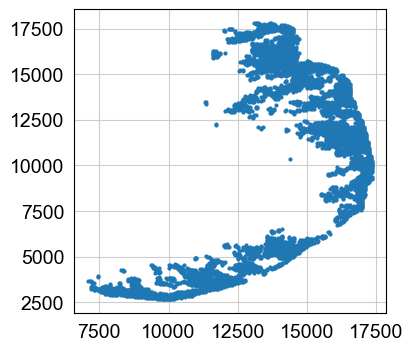

In [20]:
plt.plot(points[:,0], points[:,1], 'o', label='raww', markersize=2)

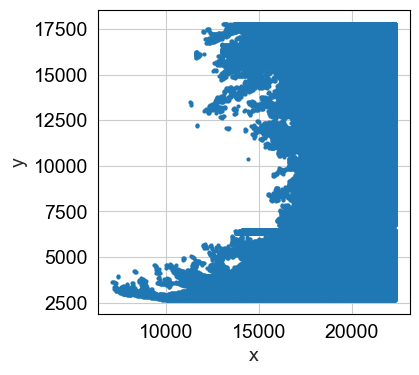

In [21]:
from scipy.interpolate import interp1d


y_unique = np.unique(points[:, 1])
x_max_for_y = [points[points[:, 1] == y_val][:, 0].max() for y_val in y_unique]

f_interp = interp1d(y_unique, x_max_for_y, kind='linear', fill_value="extrapolate")
x_smooth = f_interp(y_unique)
x_fill_max = x_smooth.max() + 5000
fill_x = np.array([np.linspace(x_val, x_fill_max, 500) for x_val in x_smooth])
fill_y = np.repeat(y_unique, 500).reshape(len(y_unique), 500)

fill_points = np.column_stack([fill_x.ravel(), fill_y.ravel()])

combined_points = np.vstack([points, fill_points])

plt.plot(combined_points[:, 0], combined_points[:, 1], 'o', markersize=2)
plt.xlabel("x")
plt.ylabel("y")
plt.show()

In [22]:
tmphull = concave_hull.concave_hull(combined_points,concavity = 0.8)

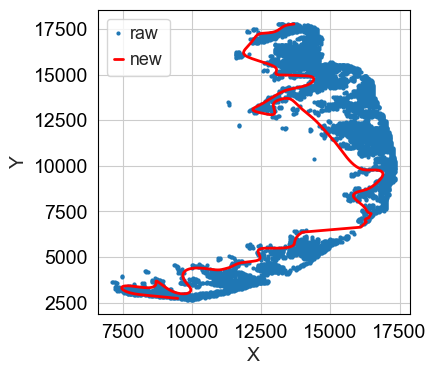

In [23]:
from skimage.measure import find_contours
from scipy.ndimage import gaussian_filter1d
x, y = tmphull[:, 0], tmphull[:, 1]
x_smooth = gaussian_filter1d(x, sigma = 10)
y_smooth = gaussian_filter1d(y, sigma=10)

y_raw = points[:, 1]
x_raw = points[:, 0]

y_unique = np.unique(y_raw)
x_max_for_y = np.array([x_raw[y_raw == y].max() for y in y_unique])

filtered_x = []
filtered_y = []

for i in range(len(y_smooth)): # 找到 y_smooth 对应的最大 x 值
    y_val = y_smooth[i]
    max_x_val = x_max_for_y[np.abs(y_unique - y_val).argmin()]  # 找到最接近的 y 值对应的最大 x
    if x_smooth[i] <= max_x_val:
        filtered_x.append(x_smooth[i])
        filtered_y.append(y_smooth[i])
filtered_x = np.array(filtered_x)
filtered_y = np.array(filtered_y)


plt.plot(points[:,0], points[:,1], 'o', label='raw', markersize=2)
plt.plot(filtered_x, filtered_y, 'r-', label='new', lw=2)
plt.legend()
plt.xlabel('X')
plt.ylabel('Y')
plt.show()

# fig3b

/tmp/ipykernel_218124/1002687522.py:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


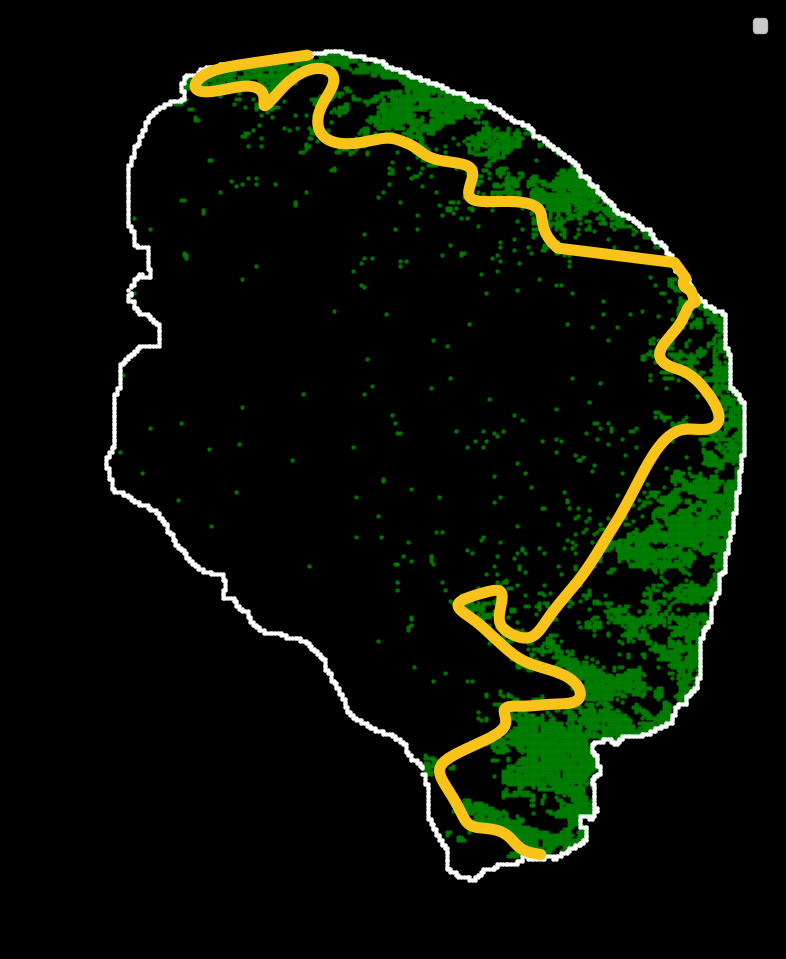

In [702]:
fig,ax = plt.subplots(figsize = (9,12))
fig.patch.set_facecolor('black')
ax.set_facecolor('black')
ax.plot(filtered_x, filtered_y, '#FAC319', lw = 8)
ax.scatter(x = plotx, y = ploty, color = 'green' ,alpha = 0.8,s = 5,edgecolor = None,rasterized =True)
ax.scatter(hull[:,0],hull[:,1],s = 5,edgecolor = None,color = 'white',rasterized =True)
ax.legend()
ax.grid(False)
ax.invert_yaxis()
fig.savefig('./Main_figure/Fig3B.pdf',bbox_inches = 'tight')

/tmp/ipykernel_3192738/671610652.py:5: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


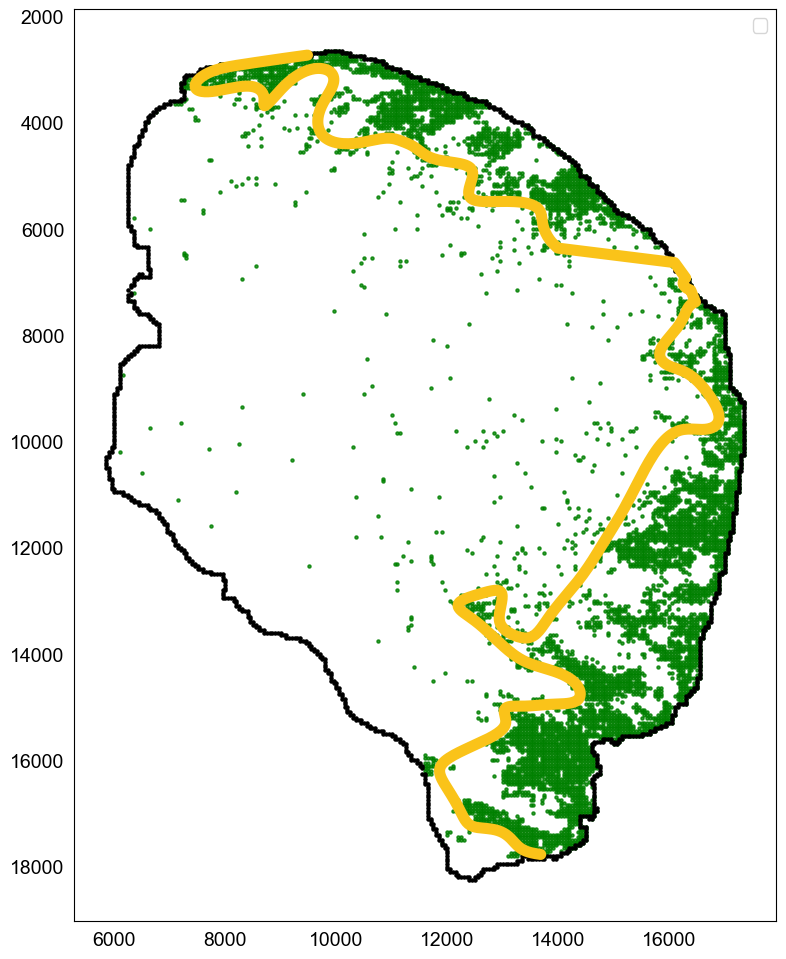

In [31]:
fig,ax = plt.subplots(figsize = (9,12))
ax.plot(filtered_x, filtered_y, '#FAC319', lw = 8)
ax.scatter(x = plotx, y = ploty, color = 'green' ,alpha = 0.8,s = 5,edgecolor = None,rasterized =True)
ax.scatter(hull[:,0],hull[:,1],s = 5,edgecolor = None,color = 'black',rasterized =True)
ax.legend()
ax.grid(False)
ax.invert_yaxis()
fig.savefig('./Main_figure/Fig3B.black_hull.pdf',bbox_inches = 'tight')

# fig 3C

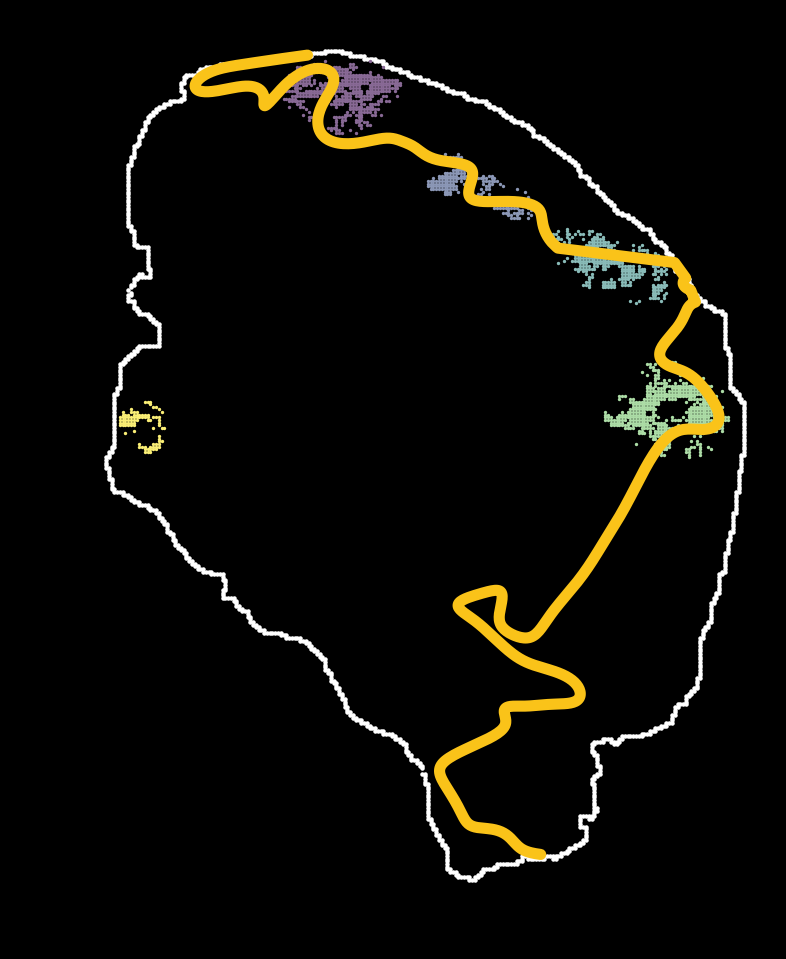

In [701]:
fig,ax = plt.subplots(figsize = (9,12))
fig.patch.set_facecolor('black')
ax.set_facecolor('black')
ax.scatter(hull[:,0],hull[:,1],s = 5,edgecolor = None,color = 'white',rasterized =True)
ax.plot(filtered_x, filtered_y, '#FAC319', lw = 8)
tls_map = {'0':'#886995','1':"#8B97B6",'2':"#89BBB8",'3':"#ACDCA6",'4':'#FAEE75'}
for tls_num in rna.obs['tls_cluster'].unique():
    if isinstance(tls_num,str):
        subadata = rna[rna.obs['tls_cluster'] == tls_num]
        points = subadata.obsm['X_spatial']
        ax.scatter(points[:,0],points[:,1],edgecolor = None, color = tls_map[tls_num],s = 2,rasterized =True)

legend = ax.get_legend()
if legend:
    for text in legend.get_texts():
        text.set_color("white")
ax.grid(False)
ax.invert_yaxis()
fig.savefig('./Main_figure/Fig3C.pdf',bbox_inches = 'tight')

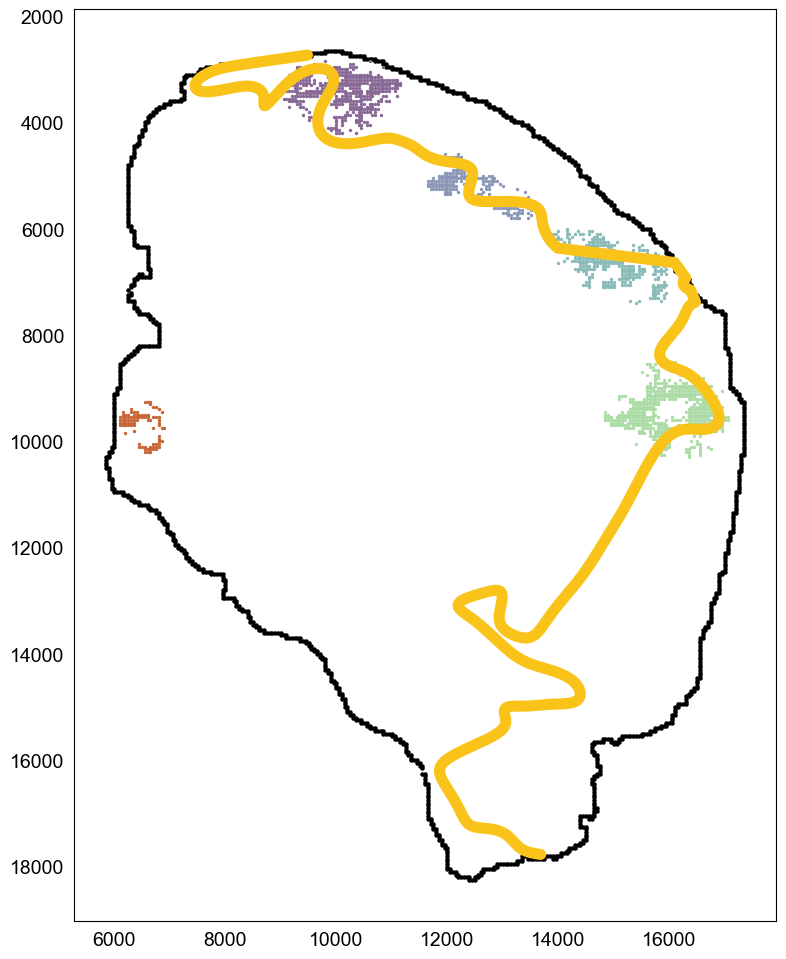

In [24]:
fig,ax = plt.subplots(figsize = (9,12))

ax.scatter(hull[:,0],hull[:,1],s = 5,edgecolor = None,color = 'black',rasterized =True)
ax.plot(filtered_x, filtered_y, '#FAC319', lw = 8)
tls_map = {'0':'#886995','1':"#8B97B6",'2':"#89BBB8",'3':"#ACDCA6",'4':'#C86536'}
for tls_num in rna.obs['tls_cluster'].unique():
    if isinstance(tls_num,str):
        subadata = rna[rna.obs['tls_cluster'] == tls_num]
        points = subadata.obsm['X_spatial']
        ax.scatter(points[:,0],points[:,1],edgecolor = None, color = tls_map[tls_num],s = 2,rasterized =True)

legend = ax.get_legend()
if legend:
    for text in legend.get_texts():
        text.set_color("black")
ax.grid(False)
ax.invert_yaxis()
fig.savefig('./Main_figure/Fig3C.black.pdf',bbox_inches = 'tight')

# figure 3D

In [11]:
combine_cellbin_binadata(cellbin,rna,obs = 'tls_cluster',binsize = 50,basis = 'X_spatial')

In [12]:
bin50.obs['tls_cluster'] = rna.obs['tls_cluster']

In [13]:
clonedf_list = []
for chain in ['IGK','IGL','IGH','TRA','TRB']:
    clonedf = spaxcr.tl.intersection(bin50,groups = None,groupby = 'tls_cluster',chain  = chain,mode = 'total')
    clonedf['share'] = clonedf['Occurance'].map(lambda x : len(x.split('+')))
    clonedf['chain'] = chain
    clonedf_list.append(clonedf)
clonedf = pd.concat(clonedf_list)

In [14]:
clonedf['share'] = clonedf['share'].map({1:'unique',2:'share=2',3:'share=3',4:'share=4',5:'share=5'})

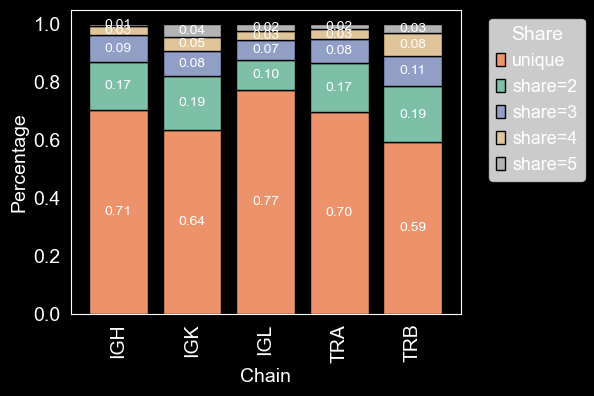

In [15]:
percentage_df = clonedf.groupby(['chain', 'share']).size().unstack().fillna(0)
percentage_df = percentage_df.div(percentage_df.sum(axis=1), axis=0)
percentage_df = percentage_df[['unique','share=2','share=3','share=4','share=5']]
fig, ax = plt.subplots(figsize=(5, 4))
fig.patch.set_facecolor('black')
ax.set_facecolor('black')
colors = {'unique': '#ED936B', 'share=2': '#7DC0A7', 'share=3': '#919FC7', 'share=4': '#E0C59A', 'share=5': '#B3B3B3'}
percentage_df.plot(kind='bar', stacked=True, ax=ax, color=[colors[col] for col in percentage_df.columns], edgecolor='black', width=0.8)

ax.set_xlabel('Chain', color='white')
ax.set_ylabel('Percentage', color='white')

legend = ax.legend(title='Share', bbox_to_anchor=(1.05, 1), loc='upper left')
legend.get_title().set_color('white')
for text in legend.get_texts():
    text.set_color('white') 
for container in ax.containers:
    ax.bar_label(container, label_type='center', fmt='%.2f', color='white', fontsize=10)

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white')
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')
ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')
ax.yaxis.label.set_color('white')
ax.xaxis.label.set_color('white')
ax.title.set_color('white')
ax.grid(False)
# fig.savefig('./Main_figure/Fig3D.pdf',bbox_inches = 'tight')

In [16]:
percentage_df

share,unique,share=2,share=3,share=4,share=5
chain,,,,,
IGH,0.705589,0.165669,0.090818,0.030938,0.006986
IGK,0.635417,0.186343,0.084491,0.049769,0.043981
IGL,0.773006,0.104294,0.067485,0.030675,0.024540
TRA,0.697674,0.168605,0.081395,0.034884,0.017442
TRB,0.592545,0.192802,0.105398,0.079692,0.029563


# sup 7a

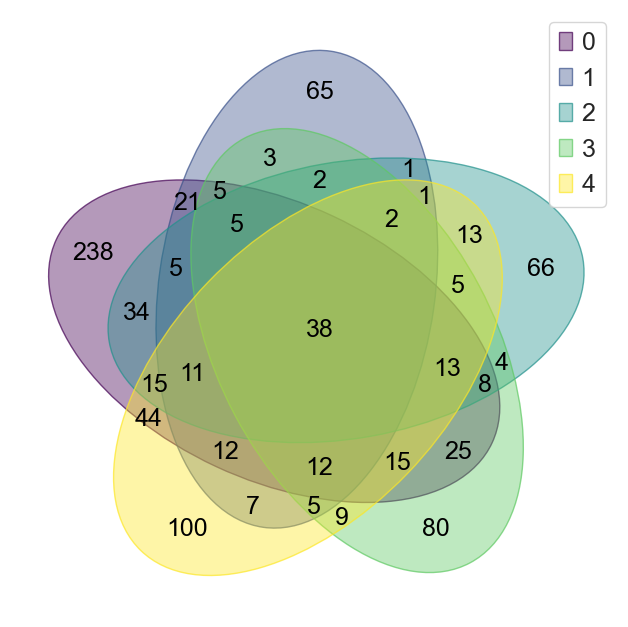

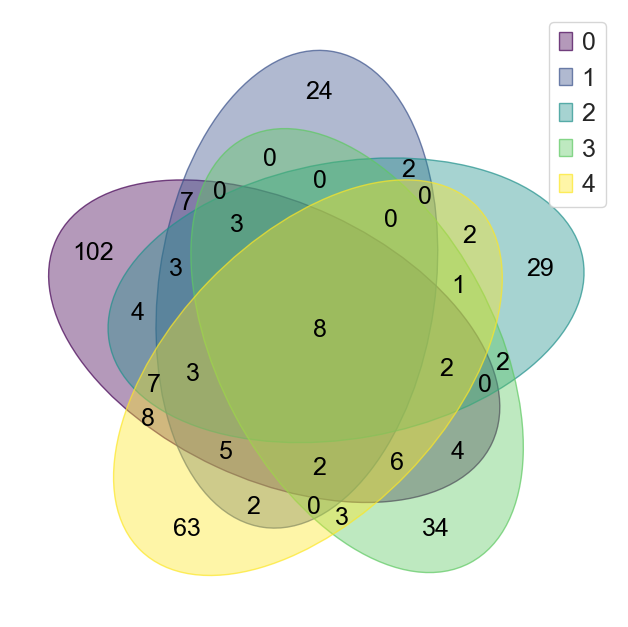

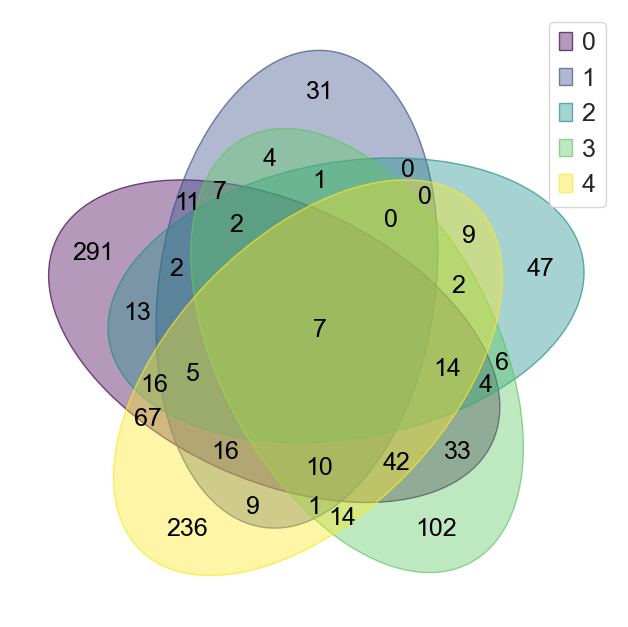

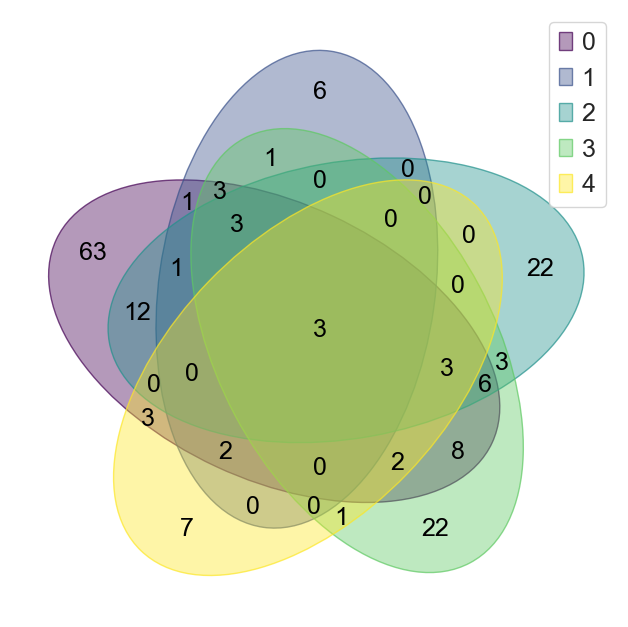

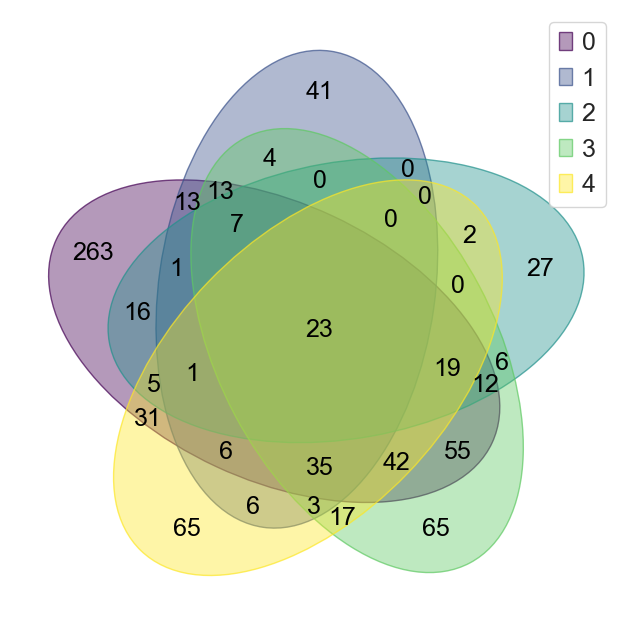

In [15]:
for chain in ['IGK','IGL','IGH','TRA','TRB']:
    spaxcr.pl.intersection(bin50,groups = ['0','1','2','3','4'],groupby = 'tls_cluster',plot = 'venn',chain  =chain,fontsize = 18,save = f'./umi/Sup8.{chain}.venn.pdf')

# sup7 f

In [13]:
clonedf = spaxcr.tl.intersection(bin50,groups = None,groupby = 'tls_cluster',chain  = 'IGH',mode = 'outer')

In [14]:
clonedf['tls'] = clonedf['Occurance'].map({'0':'peritumoral','1':'peritumoral','2':'peritumoral','3':'peritumoral','4':'intratumoral'})

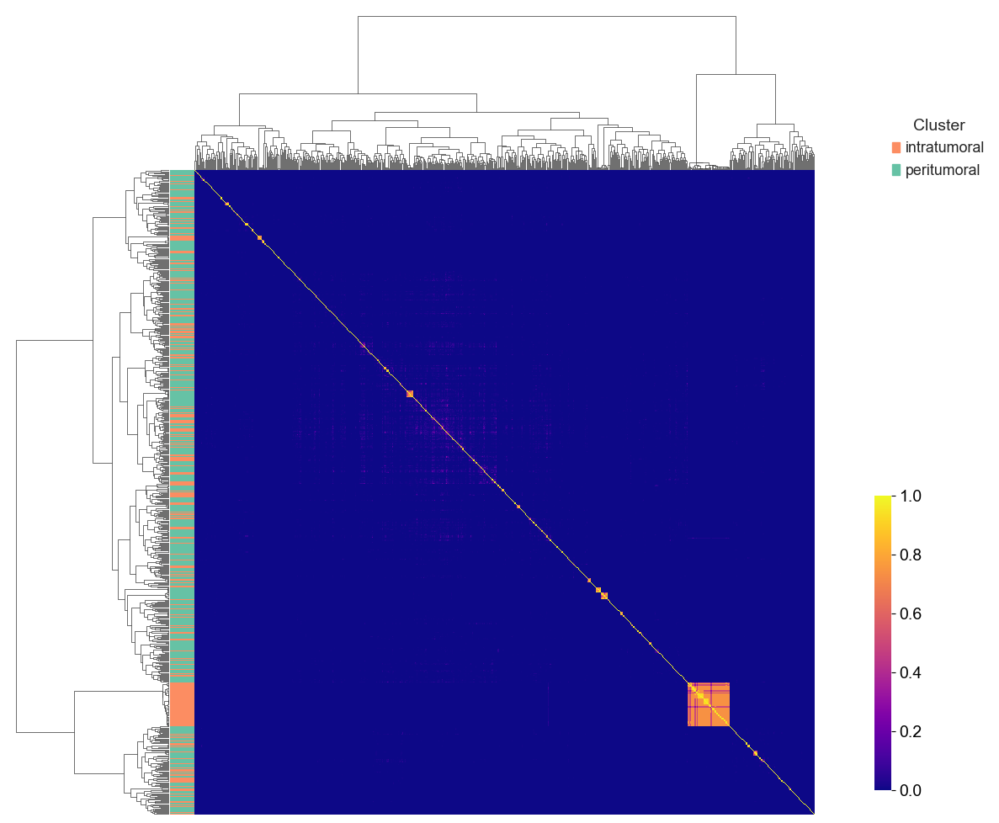

In [15]:
spaxcr.pl.similarity(cdr3s = clonedf['CDR3'],labels = clonedf['tls'],method = 'gaussian',linkage_method='ward' ,hm_cmap = 'plasma',cdr3_palette = 'Set2',figsize = (10,10),save = './umi/Sup8g.hm.pdf',rasterized =True)

In [25]:
igha = bin50.uns['XCR']['Hc2i']['IGHA'].keys()
ighg = bin50.uns['XCR']['Hc2i']['IGHG'].keys()
ighm = bin50.uns['XCR']['Hc2i']['IGHM'].keys()

In [30]:
bin50.var['IGHA'] = bin50.var_names.map(lambda x: x in igha)
bin50.var['IGHG'] = bin50.var_names.map(lambda x: x in ighg)
bin50.var['IGHM'] = bin50.var_names.map(lambda x: x in ighm)

In [36]:
bin50_igh = bin50[:,bin50.var['Chain']=='IGH'].copy()

In [37]:
bin50_igh.var['IGHA'] = bin50_igh.var['IGHA'].map(str)
bin50_igh.var['IGHG'] = bin50_igh.var['IGHG'].map(str)
bin50_igh.var['IGHM'] = bin50_igh.var['IGHM'].map(str)

In [44]:
def determine_isotype(row):
    true_columns = [col for col in ['IGHA', 'IGHG', 'IGHM'] if row[col] == 'True']
    if len(true_columns) == 0:
        return 'No_isotype'
    elif len(true_columns) == 1:
        return true_columns[0]
    else:
        return 'multiple'

bin50_igh.var['isotype'] = bin50_igh.var.apply(determine_isotype, axis=1)

In [45]:
bin50_igh.var['isotype'].value_counts()

isotype
IGHA          3326
IGHG          2710
No_isotype     982
multiple       218
IGHM             7
Name: count, dtype: int64

Found cluster : 256


/tmp/ipykernel_3655051/4262802771.py:15: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.savefig('./umi/Fig3E.circle.noraster.pdf')
/home/liuyi/miniconda3/envs/spatial/lib/python3.9/site-packages/IPython/core/events.py:82: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/home/liuyi/miniconda3/envs/spatial/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


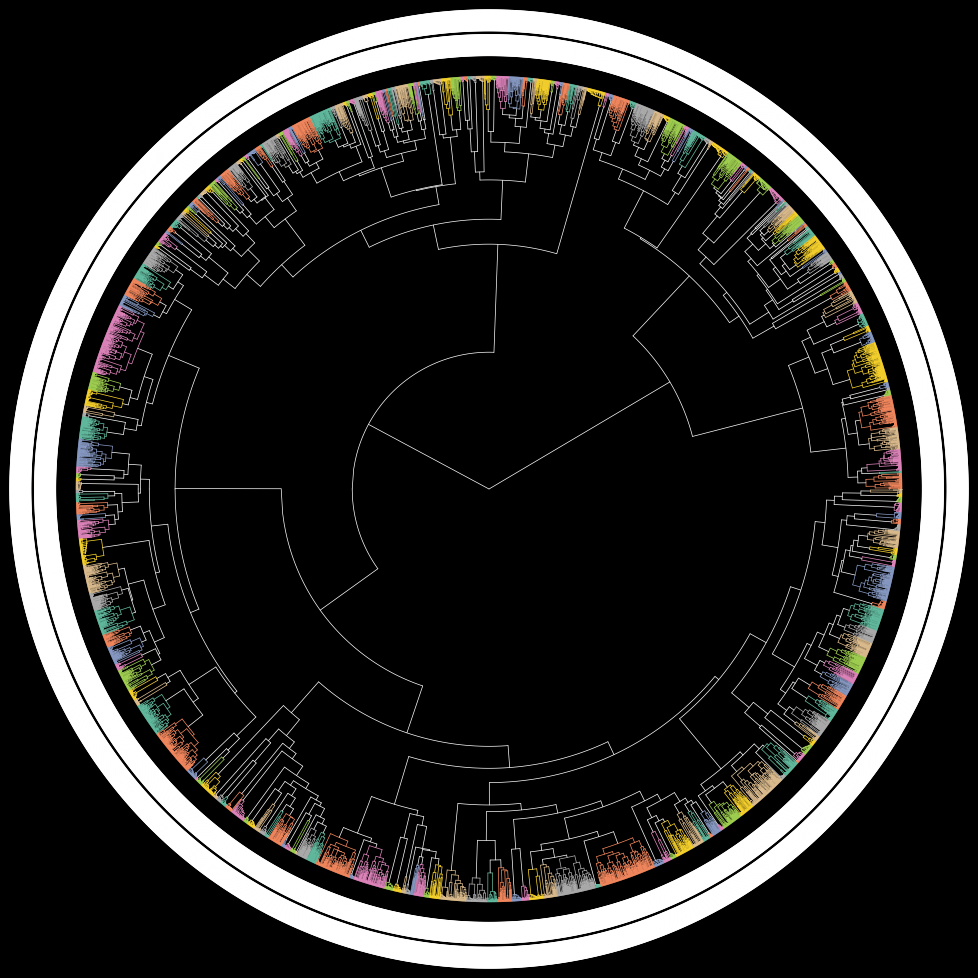

In [47]:
metas = ['BCRstatus','isotype']
color_dicts = [
    {'germline':'#E3C576','mutated':'#D97758'},{'No_isotype':'#F5F5F5','multiple':'#ff165d','IGHA':'#ff9a00','IGHG':'#f6f7d7','IGHM':'#3ec1d3'},
]

# metas = ['BCRstatus']
# color_dicts = [
#     {'germline':'#E3C576','mutated':'#D97758'},
# ]


fig,ax = spaxcr.pl.CDR3cluster(bin50_igh,chain = 'IGH',threshold = 30,linewidth =0.5,linecolor='white',linkage_method = 'ward',pallete = 'Set2',metas = metas ,color_dicts = color_dicts,alpha = 1,show = True)
ax.set_facecolor('black')
fig.patch.set_facecolor('black')
fig.savefig('./umi/Fig3E.circle.noraster.pdf')

In [24]:
cdr3_cluster = spaxcr.tl.CDR3cluster(clonedf['CDR3'].tolist(),chain = 'IGH',threshold = 7,linkage_method='ward')

In [25]:
cdr3_cluster.value_counts('cluster')

cluster
369    48
300     8
177     7
393     5
341     5
       ..
409     1
410     1
411     1
398     1
399     1
Name: count, Length: 445, dtype: int64

In [29]:
cdr3_cluster['plot'] = 'o'
cdr3_cluster.loc[cdr3_cluster['cluster']==369,'plot'] = 'e'

In [31]:
cdr3_cluster[cdr3_cluster['cluster'] == 369].to_csv('./igh.sim.csv')

In [47]:
meta = pd.read_csv('/storage/fengyu/liuzhong/Mixcr_align/PE150_data_analyze/umi/7-ZXH_LC/7-ZXH_LC.meta.umi.csv.gz',compression='gzip',sep = '\t')

/tmp/ipykernel_3890904/2517342428.py:1: DtypeWarning: Columns (18) have mixed types. Specify dtype option on import or set low_memory=False.
  meta = pd.read_csv('/storage/fengyu/liuzhong/Mixcr_align/PE150_data_analyze/umi/7-ZXH_LC/7-ZXH_LC.meta.umi.csv.gz',compression='gzip',sep = '\t')


In [48]:
meta['tmpname'] = meta['cdr3aa'] + '@' + meta['isotype']

In [49]:
submeta = meta[meta['tmpname'].isin(cdr3_cluster[cdr3_cluster['cluster']==369]['CDR3'])]

In [51]:
submeta['loc_umi'] = submeta['umi']+'@'+submeta['loc']

/tmp/ipykernel_3890904/2636003759.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  submeta['loc_umi'] = submeta['umi']+'@'+submeta['loc']


In [55]:
submeta['loc_umi'].value_counts()[:20]

loc_umi
GACCTTCTCA@6458_10101     690
TGTTCGCTCA@6461_10104     246
CCTTGCCGCT@6442_10082     213
GACCTCCTCA@6458_10101     178
GACCTTCCCA@6458_10101      52
TGTCCGCTCA@6461_10104      37
GACCTCCCCA@6458_10101      34
GGGCTCGCAG@10658_14856     32
TGTTCGCCCA@6461_10104      31
GACCTACTCA@6458_10101      19
GGGCCCGCAG@10658_14856     18
GACCTGCTCA@6458_10101      14
GACCTTCACA@6458_10101      10
TGTTCGCACA@6461_10104       9
GACCATCTCA@6458_10101       9
TGTCCGCCCA@6461_10104       8
GCCCTTCTCA@6458_10101       8
CCTGGCCGCT@6442_10082       8
CCTTGCCCCT@6442_10082       7
TGTGCGCTCA@6461_10104       7
Name: count, dtype: int64

In [76]:
def query(adata,cdr3):
    csr = adata[:,cdr3].X
    non_zero_indices = np.nonzero(csr)[0]
    obs_with_value = adata.obs_names[non_zero_indices]
    return list(obs_with_value)

In [19]:
subclonedf = cdr3_cluster[cdr3_cluster['cluster']==368]

In [20]:
subclonedf['mutation'] = subclonedf['CDR3'].map(dict(zip(cellbin.var_names,cellbin.var['BCRstatus'])))

/tmp/ipykernel_3890904/690379797.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subclonedf['mutation'] = subclonedf['CDR3'].map(dict(zip(cellbin.var_names,cellbin.var['BCRstatus'])))


In [22]:
subclonedf

,CDR3,cluster,plot,mutation
151,CAYSKPTFSCFDFW@IGH,368,e,mutated


In [291]:
cell1set = set(cellbin.uns['XCR']['i2c']['IGH'][cells_mu[0]])
cell2set = set(cellbin.uns['XCR']['i2c']['IGH'][cells_mu[1]])

In [293]:
for cdr3 in (cell2set.intersection(cell1set)):
    if cdr3 in subclonedf[subclonedf['cluster']==362]['CDR3'].tolist():
        print(cdr3.split('@')[0])

CARDRYYPGSGSRKHVYYAMDVW


In [295]:
for cdr3 in (cell2set - cell1set):
    if cdr3 in subclonedf[subclonedf['cluster']==362]['CDR3'].tolist():
        print(cdr3.split('@')[0])

CAIDRYYSGSGSRKHVYYAMDVW
CPRDRYYSGSGSRKHVYYAMDVW
CTRDRYYSGSGSRKHVYYAMDVW
CARDRYYSGWGSRKHVYYAMDVW
CARDRYYSCSGSRMHVYYAMDVW
CVRDRYYSGSGSRKHIYYAMDVW
CARDRYYSGSGSRKHVYYMDVW
CARNRYYSGSGSRKHVYYAMDVW
CGRDRYYSGSGSRKHVYYAMDVW
CARDRYYSGSGSRKYVYYAMDVW
CARDRYYSGSGSRKHVYYAMDAW
CARDRFYSGSGSRKHVYYAMDVW
CARDRYCSGSGSRKHVYYAMDVW
CAKDRYYSGSGSRKHVYYAMDVW
CARDRYFSGSGSRKHVYYAMDVW
CARDWYYSGSGSRKHVYYAMDVW
CARDRYYTGSGSRKHVYYAMDVW
CARYRYYSGSGSRKHVYYAMDVW
CARDRYYSGSGRRKHVYYAMDVW
CVRDRYYSGSGSRKHVYYTMDVW
CARDRYYSGSGSQKHVYYAMDVW
YARDRYYSGSGSRKHVYYALDVW
CARDRYYSGSRSRKHVYYAMDVW
CARHRYYSGSGSRKHVYYAMDVW
CVRDRYYSGSGSRKHVYYAMDVW
CARDRYYSGPGSRKHVYYAMDVW
CARDRYYSGSGSRKHVYYYMDVW
CARDRYYSGSGSRKHVYYATDVW
YARDRYYSGSGSRKHVYYAMDVW
CARDRYYSGSGNRKHVYYAMDVW
CARGRYYSGSGSRKHVYYAMDVW
CARDRYYSGSGSRKHIYYAMDVW
SARDRYYSGSGSRKHVYYAMDVW
CARERYYSGSGSRKHVYYAMDVW
SARDRYYSGSGSRKHVYYAMDIW
CARDRYYSGSGSRKHVYYAMDDW
CERDRYYSGSGSRKHVYYAMDVW
YARDRYYSGSGSRKHVYYAMDIW
CARDRYYSGSGSRKHVYYTMDVW
CTRDRYYSGSGSRKHVYYTMDVW
CARDGYYYGSGSRKHVYYAMDVW
CARDGYYSGSGSRKHVY

## intumor

In [80]:
# clonedf = spaxcr.tl.intersection(bin50,groups = None,groupby = 'tls_cluster',chain  = 'IGH',mode = 'outer')

In [84]:
# bin50.obs['annotation2'] = rna.obs['annotation2']

In [85]:
# cdr3ighdf_dict = {}
# unqiueclone = clonedf[clonedf['Occurance'] == '4'].copy()

# for subtype in bin50.obs['annotation2'].unique():
#     if isinstance(subtype,str):
#         cdr3ighdf = spaxcr.tl.clonestat(bin50[bin50.obs['annotation2'] == subtype],['IGH'])
#         unqiueclone[subtype] =  unqiueclone['CDR3'].isin(cdr3ighdf['CDR3'])
# counts = unqiueclone[[i for i in bin50.obs['annotation2'].unique() if isinstance(i,str)]].apply(lambda x: x.value_counts()).T
# counts = counts.loc[:,True]
# counts['TLS'] = unqiueclone.shape[0]
# intumor_order = counts.sort_values(ascending=False).index
# counts = counts.loc[intumor_order]

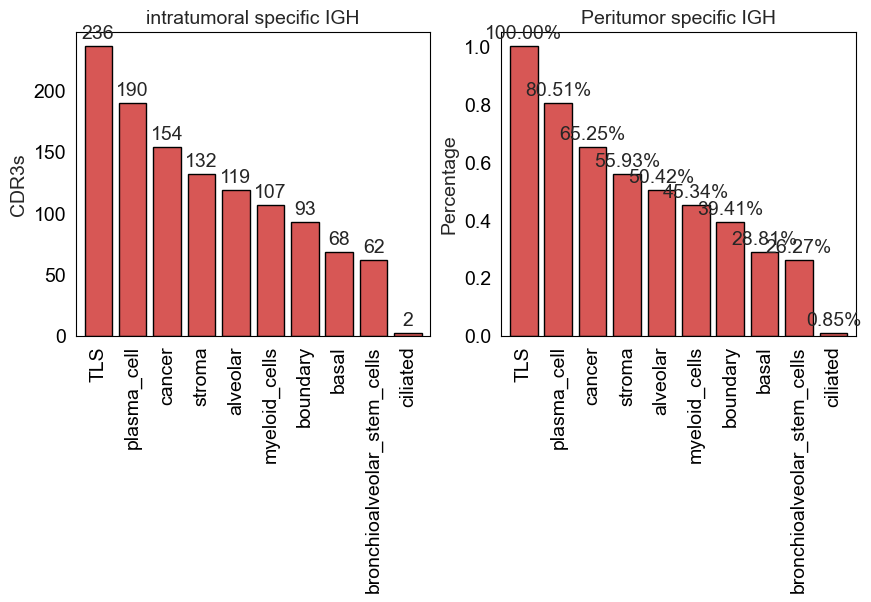

In [86]:
# fig, axs = plt.subplots(1, 2, figsize=(10, 4))
# counts.plot(kind='bar', stacked=True, ax=axs[0], edgecolor='black', color='#D75755', width=0.8)
# axs[0].set_ylabel('CDR3s')
# axs[0].grid(False)
# axs[0].set_title('intratumoral specific IGH')

# for p in axs[0].patches:
#     axs[0].annotate(format(p.get_height(), '.0f'), 
#                     (p.get_x() + p.get_width() / 2., p.get_height()), 
#                     ha='center', va='center', 
#                     xytext=(0, 9), 
#                     textcoords='offset points')

# (counts / counts['TLS']).plot(kind='bar', stacked=True, ax=axs[1], edgecolor='black', color='#D75755', width=0.8)
# axs[1].set_ylabel('Percentage')
# axs[1].grid(False)
# axs[1].set_title('Peritumor specific IGH')

# for p in axs[1].patches:
#     axs[1].annotate(format(p.get_height()*100, '.2f')+'%',  # Using '.2f' to format as a percentage
#                     (p.get_x() + p.get_width() / 2., p.get_height()), 
#                     ha='center', va='center', 
#                     xytext=(0, 9), 
#                     textcoords='offset points')

# # fig.savefig('./Sup7/intratumoral.pdf', bbox_inches='tight')
# plt.show()

In [88]:
# cdr3ighdf_dict = {}
# unqiueclone = clonedf[clonedf['Occurance'] != '4'].copy()

# for subtype in bin50.obs['annotation2'].unique():
#     if isinstance(subtype,str):
#         cdr3ighdf = spaxcr.tl.clonestat(bin50[bin50.obs['annotation2'] == subtype],['IGH'])
#         unqiueclone[subtype] =  unqiueclone['CDR3'].isin(cdr3ighdf['CDR3'])
# counts = unqiueclone[[i for i in bin50.obs['annotation2'].unique() if isinstance(i,str)]].apply(lambda x: x.value_counts()).T
# counts = counts.loc[:,True]
# counts['TLS'] = unqiueclone.shape[0]
# counts = counts.loc[intumor_order]

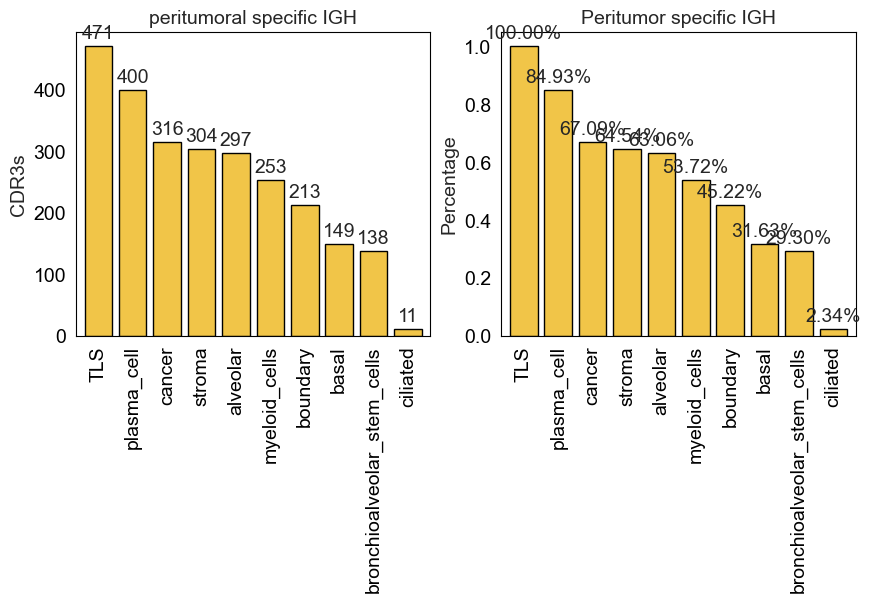

In [89]:
# fig, axs = plt.subplots(1, 2, figsize=(10, 4))
# counts.plot(kind='bar', stacked=True, ax=axs[0], edgecolor='black', color='#F1C548', width=0.8)
# axs[0].set_ylabel('CDR3s')
# axs[0].grid(False)
# axs[0].set_title('peritumoral specific IGH')

# for p in axs[0].patches:
#     axs[0].annotate(format(p.get_height(), '.0f'), 
#                     (p.get_x() + p.get_width() / 2., p.get_height()), 
#                     ha='center', va='center', 
#                     xytext=(0, 9), 
#                     textcoords='offset points')

# (counts / counts['TLS']).plot(kind='bar', stacked=True, ax=axs[1], edgecolor='black', color='#F1C548', width=0.8)
# axs[1].set_ylabel('Percentage')
# axs[1].grid(False)
# axs[1].set_title('Peritumor specific IGH')

# for p in axs[1].patches:
#     axs[1].annotate(format(p.get_height()*100, '.2f')+'%',  # Using '.2f' to format as a percentage
#                     (p.get_x() + p.get_width() / 2., p.get_height()), 
#                     ha='center', va='center', 
#                     xytext=(0, 9), 
#                     textcoords='offset points')

# # fig.savefig('./Sup7/peritumoral.pdf',bbox_inches = 'tight')
# plt.show()

# sup

In [55]:
def query(adata,cdr3):
    csr = adata[:,cdr3].X
    non_zero_indices = np.nonzero(csr)[0]
    obs_with_value = adata.obs_names[non_zero_indices]
    return list(obs_with_value)

In [56]:
mutationdict = dict(zip(cellbin.var_names,cellbin.var['BCRstatus']))
pro_list = []
for tls_num in [0,1,2,3,4]:
    tls_num = str(tls_num)
    
    unqiueclone = spaxcr.tl.clonestat(cellbin[cellbin.obs['tls_cluster'] == tls_num], chains = 'IGH')
    unqiueclone['mutation'] = unqiueclone['CDR3'].map(mutationdict)
    
    
    mutationcdr3 = unqiueclone[unqiueclone['mutation'] == 'mutated']['CDR3']

    mutationcells = []
    subadata = cellbin[cellbin.obs['tls_cluster'] == tls_num]  # tls - adata

    for cdr3 in mutationcdr3:
        cell = query(subadata,cdr3)  # tls - adata
        mutationcells.extend(cell)
        
    cells = list(set(mutationcells))
    
    mutationcells = len(cells)/subadata.shape[0] * 100
    
    print(f'TLS {tls_num} Mutated Cells: {mutationcells:.2f} %')
    pro_list.append(mutationcells)

TLS 0 Mutated Cells: 1.37 %
TLS 1 Mutated Cells: 0.77 %
TLS 2 Mutated Cells: 0.89 %
TLS 3 Mutated Cells: 0.72 %
TLS 4 Mutated Cells: 3.45 %


In [57]:

bin50.obs['tls_cluster'] = rna.obs['tls_cluster']

In [58]:
unqiueclone['mutation'] = unqiueclone['CDR3'].map(mutationdict)

In [59]:
def query(adata,cdr3):
    csr = adata[:,cdr3].X
    non_zero_indices = np.nonzero(csr)[0]
    obs_with_value = adata.obs_names[non_zero_indices]
    return list(obs_with_value)

In [60]:
mutationdict = dict(zip(cellbin.var_names,cellbin.var['BCRstatus']))
pro_list = []
for tls_num in [0,1,2,3,4]:
    tls_num = str(tls_num)
    
    unqiueclone = spaxcr.tl.clonestat(cellbin[cellbin.obs['tls_cluster'] == tls_num], chains = 'IGH')
    unqiueclone['mutation'] = unqiueclone['CDR3'].map(mutationdict)
    
    
    mutationcdr3 = unqiueclone[unqiueclone['mutation'] == 'mutated']['CDR3']

    mutationcells = []
    subadata = cellbin[cellbin.obs['tls_cluster'] == tls_num]  # tls - adata

    for cdr3 in mutationcdr3:
        cell = query(subadata,cdr3)  # tls - adata
        mutationcells.extend(cell)
        
    cells = list(set(mutationcells))
    
    mutationcells = len(cells)/subadata.shape[0] * 100
    
    print(f'TLS {tls_num} Mutated Cells: {mutationcells:.2f} %')
    pro_list.append(mutationcells)

TLS 0 Mutated Cells: 1.37 %
TLS 1 Mutated Cells: 0.77 %
TLS 2 Mutated Cells: 0.89 %
TLS 3 Mutated Cells: 0.72 %
TLS 4 Mutated Cells: 3.45 %


## tls4 debug

In [61]:
pro_list = []
for tls_num in [0,1,2,3,4]:
    tls_num = str(tls_num)
    unqiueclone = spaxcr.tl.clonestat(cellbin[cellbin.obs['tls_cluster'] == tls_num], chains = 'IGL')
    unqiueclone['mutation'] = unqiueclone['CDR3'].map(mutationdict)
    mutationcdr3 = unqiueclone[unqiueclone['mutation'] == 'mutated']['CDR3']
    germlinecdr3 = unqiueclone[unqiueclone['mutation'] == 'germline']['CDR3']

    mutationcells = []
    subadata = cellbin[cellbin.obs['tls_cluster'] == tls_num]  # tls - adata
    for cdr3 in mutationcdr3:
        cell = query(subadata,cdr3)  # tls - adata
        mutationcells.extend(cell)
    mutationcells = list(set(mutationcells))


    germlinecells = []
    for cdr3 in germlinecdr3:
        cell = query(subadata,cdr3)  # tls - adata
        germlinecells.extend(cell)
    germlinecells = list(set(germlinecells))
    
    pro_list.append([tls_num,len(mutationcells),len(germlinecells),subadata.shape[0] - len(mutationcells) - len(germlinecells)])

In [62]:
percentage_df = pd.DataFrame(pro_list,columns = ['tls','mutation','germline','rest']).set_index('tls')

In [63]:
# percentage_df.to_csv('SHMcell.csv')

In [64]:
percentage_df = percentage_df.divide(np.sum(percentage_df,axis = 1),0) * 100

/tmp/ipykernel_3655051/3675746701.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be fin

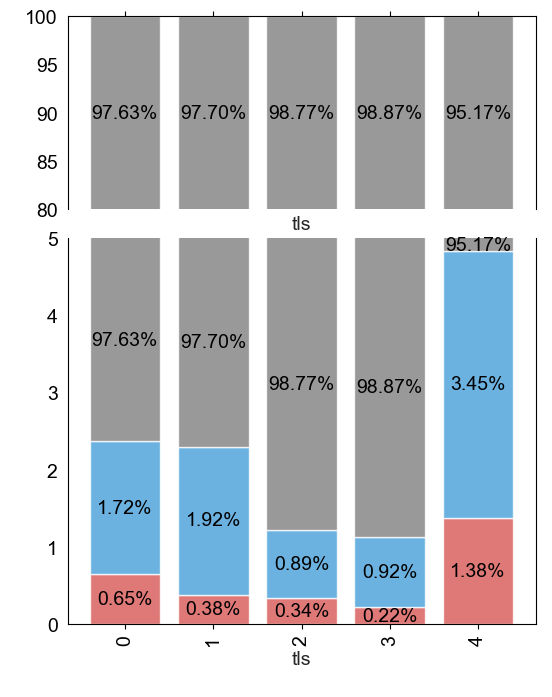

In [68]:
fig = plt.figure(figsize=(6, 8))
import matplotlib.patches as patches
from matplotlib.gridspec import GridSpec
# fig.patch.set_facecolor('black')

gs = GridSpec(2, 1, height_ratios=[1, 2], hspace=0.1)

ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])
# ax1.set_facecolor('black')  
# ax2.set_facecolor('black')

percentage_df.plot(kind='bar', stacked=True, ax=ax1, color={'mutation': '#D75755', 'germline': '#479FDA','rest':'grey'}, width=0.8,alpha = 0.8)
percentage_df.plot(kind='bar', stacked=True, ax=ax2, color={'mutation': '#D75755', 'germline': '#479FDA','rest':'grey'}, width=0.8,alpha = 0.8)
ax1.set_ylabel('')
ax1.set_xticklabels([])
ax1.get_legend().remove()
ax2.get_legend().remove()
ax1.set_ylim(80, 100)
ax2.set_ylim(0, 5)
ax1.spines['bottom'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax1.xaxis.tick_top()
ax1.tick_params(labeltop=False)
ax2.xaxis.tick_bottom()
d = .015 
# kwargs = dict(transform=ax1.transAxes, color='white', clip_on=False)
ax1.plot((-d, +d), (-d, +d), **kwargs)      
ax1.plot((1 - d, 1 + d), (-d, +d), **kwargs)

kwargs.update(transform=ax2.transAxes) 
ax2.plot((-d, +d), (1 - d, 1 + d), **kwargs) 
ax2.plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs)
for container in ax1.containers:
    ax1.bar_label(container, fmt='%.2f%%', label_type='center', color='black')

for container in ax2.containers:
    ax2.bar_label(container, fmt='%.2f%%', label_type='center', color='black')

ax1.grid(False)
ax2.grid(False)
# for ax in [ax1, ax2]:
#     ax.spines['top'].set_color('white')
#     ax.spines['right'].set_color('white')
#     ax.spines['left'].set_color('white')
#     ax.spines['bottom'].set_color('white')
#     ax.tick_params(axis='x', colors='white')
#     ax.tick_params(axis='y', colors='white')
#     ax.yaxis.label.set_color('white')
#     ax.xaxis.label.set_color('white')
#     ax.title.set_color('white')
fig.tight_layout()
plt.savefig('./umi/new_TLS.SHMcells.modified.pdf')
plt.show()

/home/liuyi/miniconda3/envs/spatial/lib/python3.9/site-packages/seaborn/categorical.py:700: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  artists = ax.bxp(**boxplot_kws)


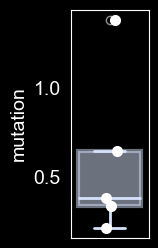

In [69]:
fig,ax1 = plt.subplots(figsize = (1,3))
fig.patch.set_facecolor('black')
ax1.set_facecolor('black')

sns.boxplot(percentage_df['mutation'], ax=ax1, color='lightyellow', linewidth=3,
            boxprops=dict(facecolor='none', color='#D6E2FB',alpha = 0.5),
            whiskerprops=dict(color='#D6E2FB', linewidth=2),
            capprops=dict(color='#D6E2FB', linewidth=2),
            medianprops=dict(color='#D6E2FB', linewidth=2))

sns.stripplot(percentage_df['mutation'],ax = ax1,color = 'white',s = 8,jitter=0.2)

ax1.spines['top'].set_color('white')
ax1.spines['right'].set_color('white')
ax1.spines['left'].set_color('white')
ax1.spines['bottom'].set_color('white')
ax1.tick_params(axis='x', colors='white')
ax1.tick_params(axis='y', colors='white')
ax1.yaxis.label.set_color('white')
ax1.xaxis.label.set_color('white')
ax1.title.set_color('white')
ax1.grid(False)
fig.savefig('./umi/Sup8f.boxplot.pdf',bbox_inches = 'tight')

In [71]:
percentage_df['mutation']

grouped =percentage_df['mutation']
summary = grouped.agg(
    Median=np.median,
    Q25=lambda x: x.quantile(0.25),
    Q75=lambda x: x.quantile(0.75)
)
summary

/tmp/ipykernel_3655051/2733358873.py:4: FutureWarning: The provided callable <function median at 0x7f58f81c84c0> is currently using Series.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
  summary = grouped.agg(


Median    0.383142
Q25       0.337981
Q75       0.645856
Name: mutation, dtype: float64

In [72]:
percentage_df

,mutation,germline,rest
tls,,,
0,0.645856,1.722282,97.631862
1,0.383142,1.915709,97.701149
2,0.337981,0.887199,98.774820
3,0.217234,0.917210,98.865556
4,1.379310,3.448276,95.172414


# csr

In [9]:
cellbin[:,cellbin.var['Chain']=='IGH'].var['BCRstatus'].value_counts()

BCRstatus
germline    1430
mutated     1102
Name: count, dtype: int64

In [10]:
combine_cellbin_binadata(cellbin,rna,obs = 'annotation2',basis = 'X_spatial')
annodict = dict(zip(cellbin.obs_names,cellbin.obs['annotation2']))
mutationdict = dict(zip(cellbin.var_names,cellbin.var['BCRstatus']))

In [11]:
csrdf_list = []
# m2a  m2g  a&g
for aftercsr in ['IGHA','IGHG']:
    unqiueclone = spaxcr.tl.clonestat(cellbin, chains = 'IGH')
    unqiueclone['A'] = unqiueclone['CDR3'].map(lambda x :cellbin.uns['XCR']['Hc2i'][aftercsr].get(x))
    unqiueclone['B'] = unqiueclone['CDR3'].map(lambda x :cellbin.uns['XCR']['Hc2i']['IGHM'].get(x))

    unqiueclone['Acell'] = unqiueclone['A'].map(lambda x :  list(set([annodict.get(cell) for cell in x]))  if x is not None  else None )
    unqiueclone['Bcell'] = unqiueclone['B'].map(lambda x :  list(set([annodict.get(cell) for cell in x]))  if x is not None  else None )
    
    unqiueclone['csr'] = (~unqiueclone['Acell'].isna()) &(~unqiueclone['Bcell'].isna()) 
    csrdf = unqiueclone[unqiueclone['csr']].copy()
    if csrdf.shape[0]!=0:
        csrdf['overlap'] = csrdf.apply(lambda x :  set(x[f'Bcell']).intersection(x['Acell']),axis = 1)
        csrdf['m'] = csrdf['CDR3'].map(mutationdict)
     #    csrdf = csrdf[csrdf['m'] == 'hypermutation']
        if aftercsr == 'IGHA':
            csrdf['type'] = 'm2a'
        else:
            csrdf['type'] = 'm2g'
        csrdf_list.append(csrdf)

unqiueclone = spaxcr.tl.clonestat(cellbin, chains = 'IGH')
unqiueclone['A'] = unqiueclone['CDR3'].map(lambda x :cellbin.uns['XCR']['Hc2i']['IGHA'].get(x))
unqiueclone['B'] = unqiueclone['CDR3'].map(lambda x :cellbin.uns['XCR']['Hc2i']['IGHG'].get(x))

unqiueclone[f'Acell'] = unqiueclone['A'].map(lambda x :  list(set([annodict.get(cell) for cell in x]))  if x is not None  else None )
unqiueclone['Bcell'] = unqiueclone['B'].map(lambda x :  list(set([annodict.get(cell) for cell in x]))  if x is not None  else None )

unqiueclone['csr'] = (~unqiueclone['Acell'].isna()) &(~unqiueclone['Bcell'].isna()) 
csrdf = unqiueclone[unqiueclone['csr']].copy()
if csrdf.shape[0]!=0:
    csrdf['overlap'] = csrdf.apply(lambda x :  set(x[f'Acell']).intersection(x['Bcell']),axis = 1)
    csrdf['m'] = csrdf['CDR3'].map(mutationdict)
    # csrdf = csrdf[csrdf['m'] == 'hypermutation']
    csrdf['type'] = 'a&g'
    csrdf_list.append(csrdf)

In [12]:
csralldf = pd.concat(csrdf_list)

In [13]:
csralldf = csralldf[csralldf['overlap'].map(lambda x: len(x)!=0)]

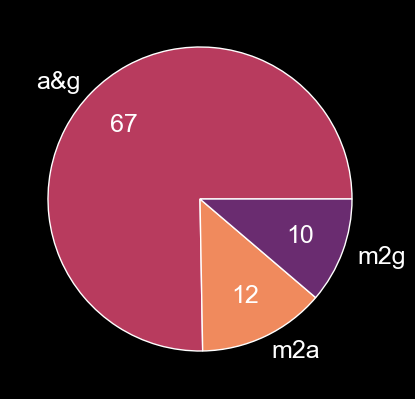

In [14]:
def absolute_value(pct,total):
    return int(round(pct*total/100.0))

vc = csralldf['type'].value_counts()
total = vc.sum()
fig,ax = plt.subplots(figsize = (5,5))
ax.pie(vc,labels = vc.index,autopct=lambda p: f'{absolute_value(p,total)}',colors=['#b83b5e', '#f08a5d','#6a2c70'],textprops={'fontsize': 18,'color' : 'white'},pctdistance=0.7)
ax.set_facecolor('black')
fig.patch.set_facecolor('black')
fig.savefig('./umi/Fig3f.csr.pdf')

In [29]:
tmp = csralldf[csralldf['type'] == 'a&g']
total = []
for s in tmp['overlap']:
    total.extend(s)
from collections import Counter
Counter(total)

Counter({'cancer': 38,
         'plasma_cell': 29,
         'stroma': 28,
         'alveolar': 23,
         'boundary': 19,
         'myeloid_cells': 12,
         'TLS': 12,
         'basal': 7,
         'bronchioalveolar_stem_cells': 5,
         'ciliated': 1})

In [24]:
total = []
for s in csralldf['overlap']:
    total.extend(s)
from collections import Counter
Counter(total)

Counter({'cancer': 52,
         'stroma': 42,
         'plasma_cell': 39,
         'alveolar': 30,
         'boundary': 24,
         'TLS': 18,
         'myeloid_cells': 12,
         'basal': 10,
         'bronchioalveolar_stem_cells': 6,
         'ciliated': 1})

(0.0, 100.0, 0.0, 100.0)

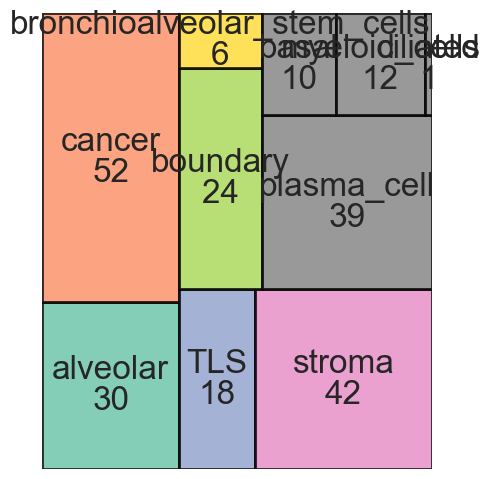

In [103]:
tmpcsralldf = csralldf

import squarify
from collections import Counter
total = []
for s in tmpcsralldf['overlap']:
    total.extend(s)
total = [x for x in total if x is not None and not (isinstance(x, float) and np.isnan(x))]
top = 6
colors = list(plt.get_cmap('Set2').colors[:top])
total_unique_count = len(Counter(total))
if total_unique_count > top:
    colors += ['grey'] * (total_unique_count - top)
plt.figure(figsize=(5, 6))
squarify.plot(sizes=Counter(total).values(), label=Counter(total).keys(),value=Counter(total).values(),text_kwargs = {'fontsize' :24}, color = colors,alpha=.8, edgecolor="black", linewidth=2)
plt.axis('off')
# plt.savefig('./Main_figure/Fig3i.csr.pdf',bbox_inches = 'tight')

In [107]:
csr_count_dict = dict(Counter(total))
annotation2_counts = rna.obs['annotation2'].value_counts().to_dict()
division_result = {
    key: round((csr_count_dict[key] / annotation2_counts[key]) * 100, 1)
    for key in csr_count_dict if key in annotation2_counts
}

In [119]:
color_dict = dict(zip(rna.obs['annotation2'].cat.categories,rna.uns['annotation2_colors']))

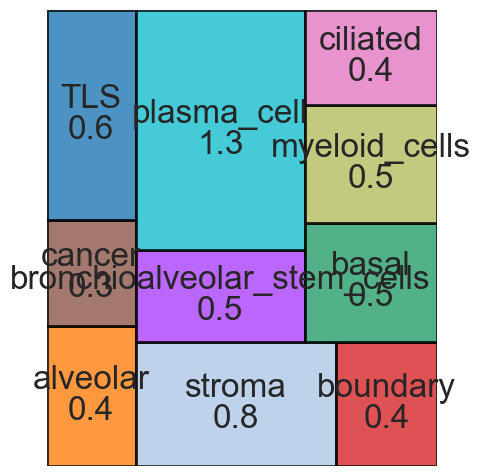

In [121]:
plt.figure(figsize=(5, 6))
squarify.plot(sizes=division_result.values(), label=division_result.keys(),value=division_result.values(),text_kwargs = {'fontsize' :24}, color = [color_dict[i] for i in division_result.keys()],alpha=.8, edgecolor="black", linewidth=2)
plt.axis('off')
plt.savefig('./umi/Fig3g.csr_frequency.pdf',bbox_inches = 'tight')

In [137]:
a_g_vc = csralldf[csralldf['type'].isin(['a&g'])].value_counts('m')
a_g_vc = (a_g_vc/a_g_vc.sum()).to_frame()

In [138]:
mag_vc = csralldf[csralldf['type'].isin(['m2a','m2g'])].value_counts('m')
mag_vc = (mag_vc/mag_vc.sum()).to_frame()

In [139]:
csr_m = pd.concat([a_g_vc,mag_vc],axis = 1).fillna(0)
csr_m.columns = ['a&g','m2ag']

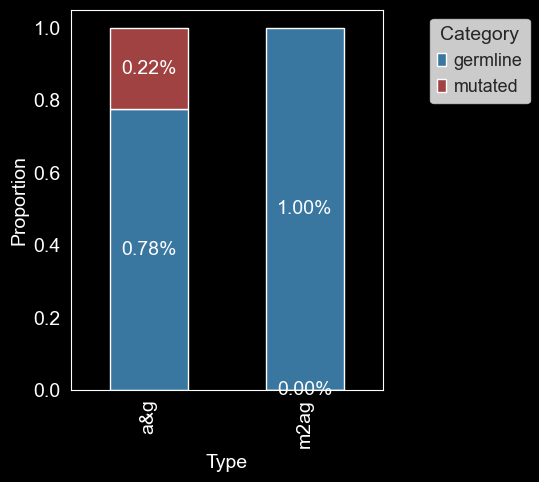

In [155]:
csr_m_transposed = csr_m.T

fig,ax = plt.subplots(figsize = (4,5))
colors = ['#3977A1', '#A14242']
csr_m_transposed.plot(kind='bar', stacked=True, color=colors,edgecolor='white',ax = ax)
ax.set_ylabel("Proportion")
ax.set_xlabel("Type")
ax.legend(title="Category", loc="upper right",bbox_to_anchor = (1.5,1))
ax.grid(False)
ax.set_facecolor('black')
fig.patch.set_facecolor('black')
ax.spines['top'].set_color('white')
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')
ax.spines['bottom'].set_color('white')
ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')
ax.yaxis.label.set_color('white')
ax.xaxis.label.set_color('white')
ax.title.set_color('white')
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f%%', label_type='center', color='white')
fig.savefig('./umi/Fig3h.pdf')

In [33]:
anno_dict = dict(zip(rna.obs['annotation2'].cat.categories,rna.uns['annotation2_colors']))

In [34]:
igha_cell = cellbin.uns['XCR']['Hc2i']['IGHA'].get('CARQIITMSINWIDPW@IGH')
ighm_cell = cellbin.uns['XCR']['Hc2i']['IGHM'].get('CARQIITMSINWIDPW@IGH')

ihga_cell_m = cellbin.uns['XCR']['Hc2i']['IGHA'].get("CARGSAQLTYYFDWW@IGH")
ihgg_cell_m = cellbin.uns['XCR']['Hc2i']['IGHG'].get("CARGSAQLTYYFDWW@IGH")

ihga_cell_g = cellbin.uns['XCR']['Hc2i']['IGHA'].get("CVRGGHGNSWYESDYW@IGH")
ihgg_cell_g = cellbin.uns['XCR']['Hc2i']['IGHG'].get("CVRGGHGNSWYESDYW@IGH")

In [ ]:
细胞里面代表CDR3 。外圈圈圈 isotype，手标mu

In [35]:
cellidslist = [ighm_cell,igha_cell,ihga_cell_m,ihgg_cell_m,ihga_cell_g,ihgg_cell_g]

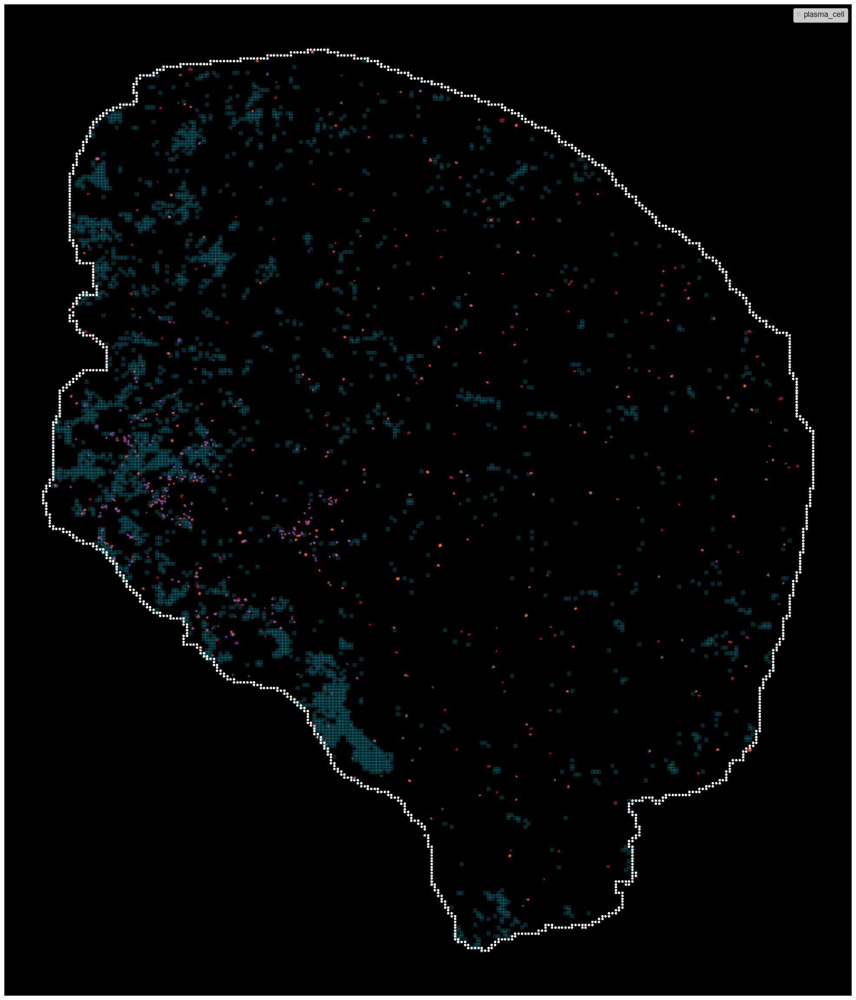

In [173]:
cellidslist = [ighm_cell,igha_cell,ihga_cell_m,ihgg_cell_m,ihga_cell_g,ihgg_cell_g]
colors = ['#6a2c70','#6a2c70','#b83b5e','#b83b5e','#f08a5d','#f08a5d']
outline_colors = ['green','red','red','blue','red','blue']

hull = cellbin.uns['hull']
background = pd.DataFrame(rna.obsm['X_spatial'],columns = ['x','y'])
background['value'] = rna.obs['annotation2'].to_list()

background = background[background['value'] == 'plasma_cell']

fig,ax = plt.subplots(figsize = (25,30))

sns.scatterplot(x = background['x'],y = background['y'],hue = background['value'],marker='s' ,edgecolors=None,rasterized =True,alpha = 0.2,palette=anno_dict)
ax.scatter(hull[:,0],hull[:,1],edgecolors = None, color = 'white', s = 10,rasterized =True)
ax.set_facecolor('black')


total_cells_plot = list(set([ m for i in cellidslist for m in i ]))
total_cellpose_df = cellbin.uns['cellpose']
total_outline_df = cellbin.uns['outline']

cellpose_df = total_cellpose_df[total_cellpose_df['cellID'].isin(total_cells_plot)]
outline_df = total_outline_df[total_outline_df['cellID'].isin(total_cells_plot)]


for cellids,color,outline_color in zip(cellidslist,colors,outline_colors):
    plotspot = cellpose_df[cellpose_df['cellID'].isin(cellids)]
    outlinespot = outline_df[outline_df['cellID'].isin(cellids)]
    ax.scatter(plotspot['x'],plotspot['y'],s = 0.01 ,color = color,edgecolors=None,rasterized =True,alpha = 0.3)
    sns.scatterplot(x = outlinespot['x'],y = outlinespot['y'],color = outline_color,s = 0.09,edgecolors=None,rasterized =True,ax = ax)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.invert_yaxis()
ax.grid(False)
fig.savefig('./Fig3i.CARQIITMSINWIDPW_6a2c70.CARGSAQLTYYFDWW_b83b5e.CVRGGHGNSWYESDYW_f08a5d.outline_IGHM_green.IGHA_red.IGHG_blue.pdf')

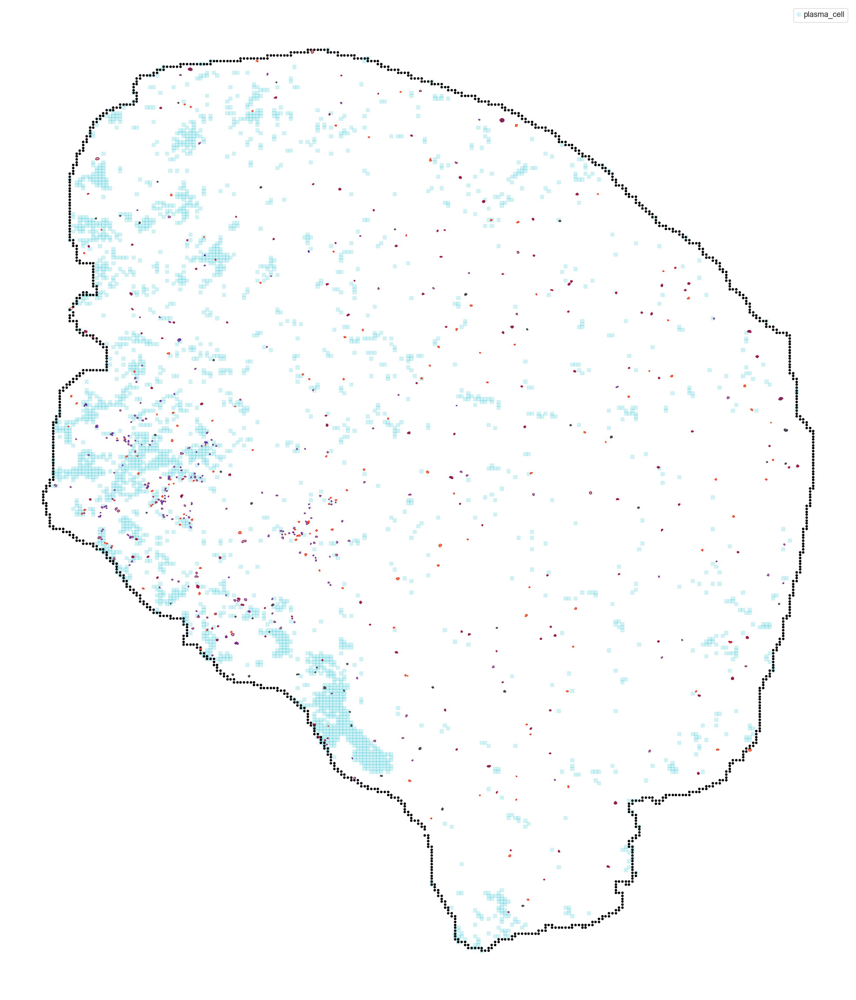

In [36]:
cellidslist = [ighm_cell,igha_cell,ihga_cell_m,ihgg_cell_m,ihga_cell_g,ihgg_cell_g]
colors = ['#6a2c70','#6a2c70','#b83b5e','#b83b5e','#f08a5d','#f08a5d']
outline_colors = ['green','red','red','blue','red','blue']

hull = cellbin.uns['hull']
background = pd.DataFrame(rna.obsm['X_spatial'],columns = ['x','y'])
background['value'] = rna.obs['annotation2'].to_list()

background = background[background['value'] == 'plasma_cell']

fig,ax = plt.subplots(figsize = (25,30))

sns.scatterplot(x = background['x'],y = background['y'],hue = background['value'],marker='s' ,edgecolors=None,rasterized =True,alpha = 0.2,palette=anno_dict)
ax.scatter(hull[:,0],hull[:,1],edgecolors = None, color = 'black', s = 10,rasterized =True)

total_cells_plot = list(set([ m for i in cellidslist for m in i ]))
total_cellpose_df = cellbin.uns['cellpose']
total_outline_df = cellbin.uns['outline']

cellpose_df = total_cellpose_df[total_cellpose_df['cellID'].isin(total_cells_plot)]
outline_df = total_outline_df[total_outline_df['cellID'].isin(total_cells_plot)]


for cellids,color,outline_color in zip(cellidslist,colors,outline_colors):
    plotspot = cellpose_df[cellpose_df['cellID'].isin(cellids)]
    outlinespot = outline_df[outline_df['cellID'].isin(cellids)]
    ax.scatter(plotspot['x'],plotspot['y'],s = 0.01 ,color = color,edgecolors=None,rasterized =True,alpha = 0.3)
    sns.scatterplot(x = outlinespot['x'],y = outlinespot['y'],color = outline_color,s = 0.09,edgecolors=None,rasterized =True,ax = ax)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.invert_yaxis()
ax.grid(False)
fig.savefig('./Fig3i.black.CARQIITMSINWIDPW_6a2c70.CARGSAQLTYYFDWW_b83b5e.CVRGGHGNSWYESDYW_f08a5d.outline_IGHM_green.IGHA_red.IGHG_blue.pdf')

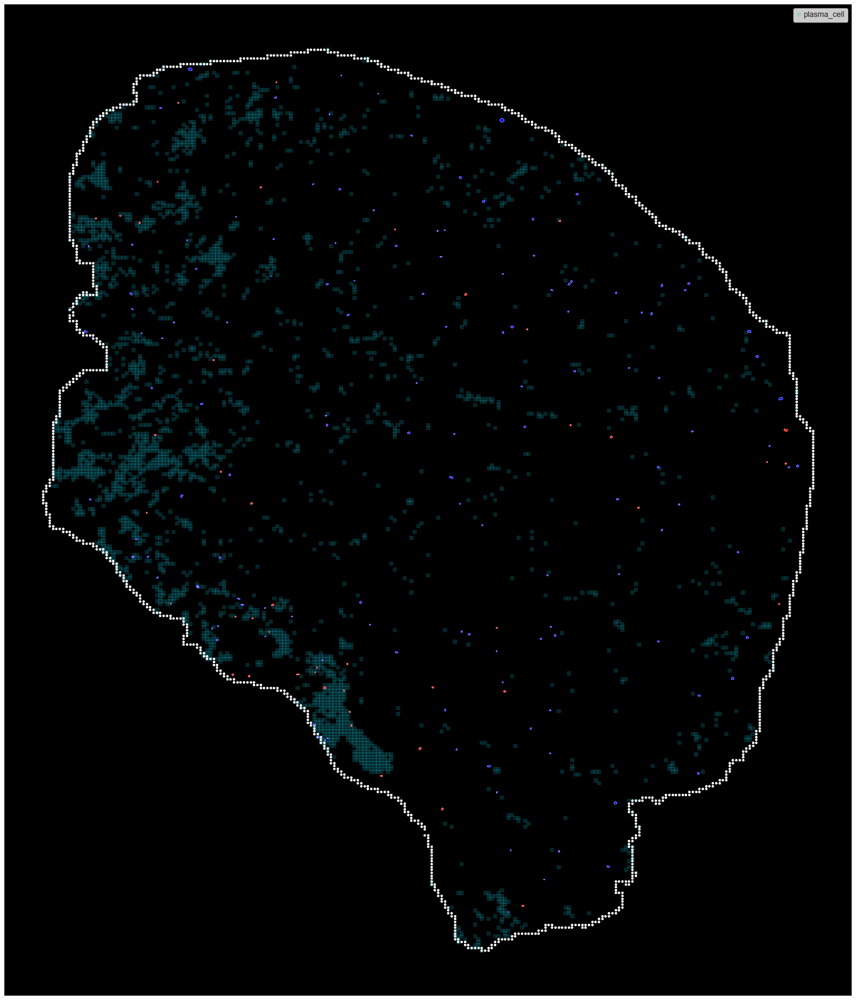

In [174]:
cellidslist = [ighm_cell,igha_cell,]
colors = ['red','blue']

hull = cellbin.uns['hull']
background = pd.DataFrame(rna.obsm['X_spatial'],columns = ['x','y'])
background['value'] = rna.obs['annotation2'].to_list()

background = background[background['value'] == 'plasma_cell']

fig,ax = plt.subplots(figsize = (25,30))

sns.scatterplot(x = background['x'],y = background['y'],hue = background['value'],marker='s' ,edgecolors=None,rasterized =True,alpha = 0.2,palette=anno_dict)
ax.scatter(hull[:,0],hull[:,1],edgecolors = None, color = 'white', s = 10,rasterized =True)
ax.set_facecolor('black')


total_cells_plot = list(set([ m for i in cellidslist for m in i ]))
total_cellpose_df = cellbin.uns['cellpose']
total_outline_df = cellbin.uns['outline']

cellpose_df = total_cellpose_df[total_cellpose_df['cellID'].isin(total_cells_plot)]
outline_df = total_outline_df[total_outline_df['cellID'].isin(total_cells_plot)]


for cellids,color,outline_color in zip(cellidslist,colors,outline_colors):
    plotspot = cellpose_df[cellpose_df['cellID'].isin(cellids)]
    outlinespot = outline_df[outline_df['cellID'].isin(cellids)]
    ax.scatter(plotspot['x'],plotspot['y'],s = 0.01 ,color = color,edgecolors=None,rasterized =True,alpha = 0.3)
    sns.scatterplot(x = outlinespot['x'],y = outlinespot['y'],color = 'white',s = 0.09,edgecolors=None,rasterized =True,ax = ax)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.invert_yaxis()
ax.grid(False)
fig.savefig('./Fig3i.m2a.red_ighm,blue_igha.CARQIITMSINWIDPW.pdf')

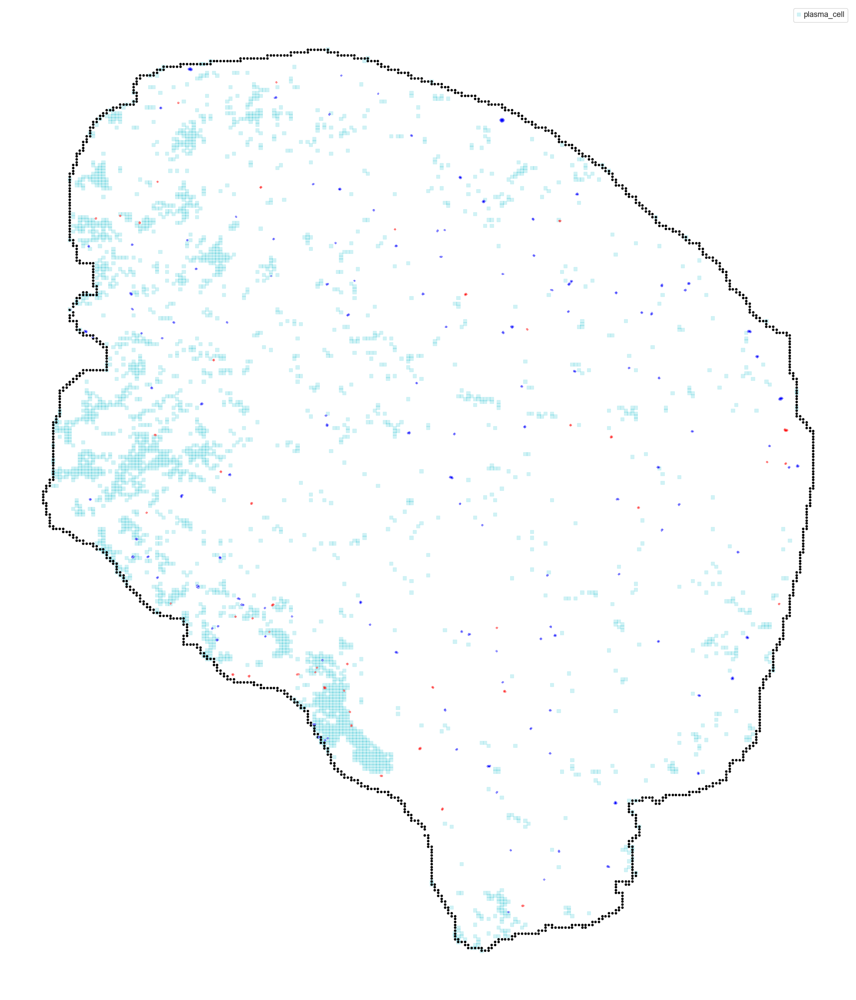

In [37]:
cellidslist = [ighm_cell,igha_cell,]
colors = ['red','blue']

hull = cellbin.uns['hull']
background = pd.DataFrame(rna.obsm['X_spatial'],columns = ['x','y'])
background['value'] = rna.obs['annotation2'].to_list()

background = background[background['value'] == 'plasma_cell']

fig,ax = plt.subplots(figsize = (25,30))

sns.scatterplot(x = background['x'],y = background['y'],hue = background['value'],marker='s' ,edgecolors=None,rasterized =True,alpha = 0.2,palette=anno_dict)
ax.scatter(hull[:,0],hull[:,1],edgecolors = None, color = 'black', s = 10,rasterized =True)

total_cells_plot = list(set([ m for i in cellidslist for m in i ]))
total_cellpose_df = cellbin.uns['cellpose']
total_outline_df = cellbin.uns['outline']

cellpose_df = total_cellpose_df[total_cellpose_df['cellID'].isin(total_cells_plot)]
outline_df = total_outline_df[total_outline_df['cellID'].isin(total_cells_plot)]


for cellids,color,outline_color in zip(cellidslist,colors,outline_colors):
    plotspot = cellpose_df[cellpose_df['cellID'].isin(cellids)]
    outlinespot = outline_df[outline_df['cellID'].isin(cellids)]
    ax.scatter(plotspot['x'],plotspot['y'],s = 0.01 ,color = color,edgecolors=None,rasterized =True,alpha = 0.3)
    sns.scatterplot(x = outlinespot['x'],y = outlinespot['y'],color = 'white',s = 0.09,edgecolors=None,rasterized =True,ax = ax)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.invert_yaxis()
ax.grid(False)
fig.savefig('./Fig3i.black.m2a.red_ighm,blue_igha.CARQIITMSINWIDPW.pdf')

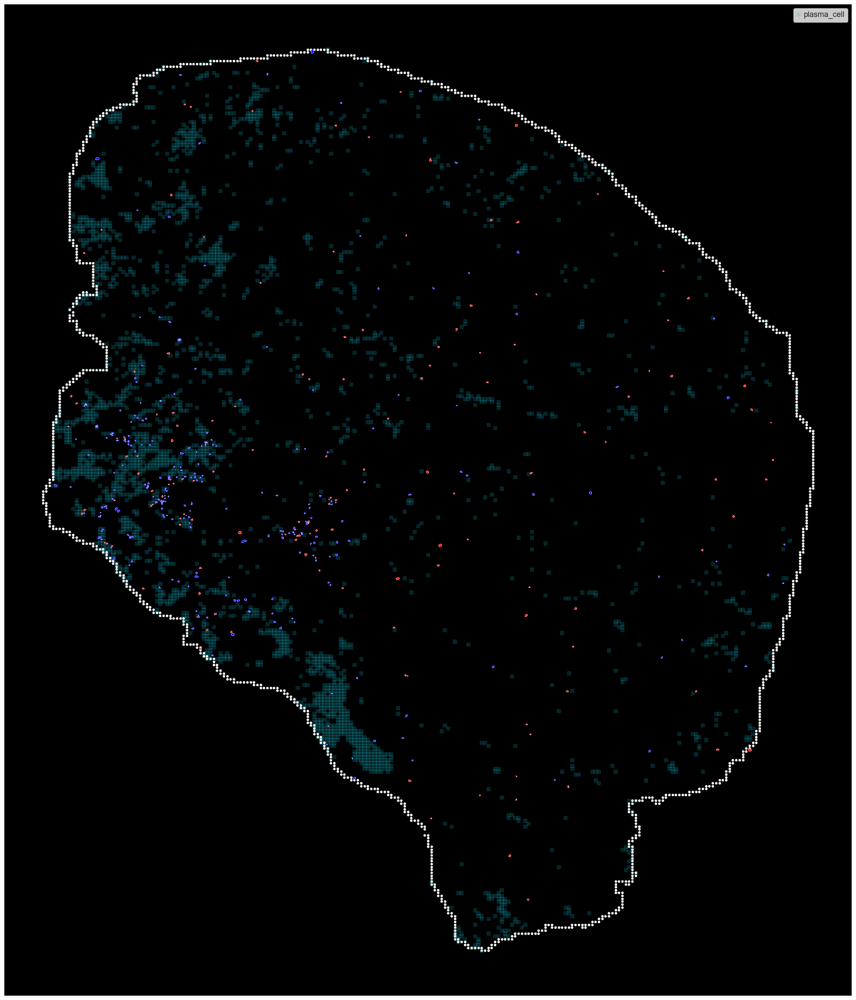

In [171]:
cellidslist = [ihga_cell_g,ihgg_cell_g]
colors = ['red','blue']

hull = cellbin.uns['hull']
background = pd.DataFrame(rna.obsm['X_spatial'],columns = ['x','y'])
background['value'] = rna.obs['annotation2'].to_list()

background = background[background['value'] == 'plasma_cell']

fig,ax = plt.subplots(figsize = (25,30))

sns.scatterplot(x = background['x'],y = background['y'],hue = background['value'],marker='s' ,edgecolors=None,rasterized =True,alpha = 0.2,palette=anno_dict)
ax.scatter(hull[:,0],hull[:,1],edgecolors = None, color = 'white', s = 10,rasterized =True)
ax.set_facecolor('black')


total_cells_plot = list(set([ m for i in cellidslist for m in i ]))
total_cellpose_df = cellbin.uns['cellpose']
total_outline_df = cellbin.uns['outline']

cellpose_df = total_cellpose_df[total_cellpose_df['cellID'].isin(total_cells_plot)]
outline_df = total_outline_df[total_outline_df['cellID'].isin(total_cells_plot)]


for cellids,color,outline_color in zip(cellidslist,colors,outline_colors):
    plotspot = cellpose_df[cellpose_df['cellID'].isin(cellids)]
    outlinespot = outline_df[outline_df['cellID'].isin(cellids)]
    ax.scatter(plotspot['x'],plotspot['y'],s = 0.01 ,color = color,edgecolors=None,rasterized =True,alpha = 0.3)
    sns.scatterplot(x = outlinespot['x'],y = outlinespot['y'],color = 'white',s = 0.09,edgecolors=None,rasterized =True,ax = ax)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.invert_yaxis()
ax.grid(False)
fig.savefig('./Fig3i.a2g_gremline.red_igha.blue_ighg.CVRGGHGNSWYESDYW.pdf')

In [ ]:
cellidslist = [cell_list1,cell_list2]  #  cell_list 里面放 你想要画的细胞cellid cell_list1 = ['cell.1','cell.2'] 这样
colors = ['red','blue']   # colors 就是这些细胞是什么颜色  red 是 cell_list1 的颜色，blue 是cell_list2的颜色

hull = cellbin.uns['hull']   # hull 这个是用concave_hull 检测的边界（代码额外给你）
background = pd.DataFrame(rna.obsm['X_spatial'],columns = ['x','y'])  #（这个是背景 的坐标）
background['value'] = rna.obs['annotation2'].to_list()   # 这个是背景的坐标+着色

fig,ax = plt.subplots(figsize = (25,30))

sns.scatterplot(x = background['x'],y = background['y'],hue = background['value'],marker='s' ,edgecolors=None,rasterized =True,alpha = 0.2,palette=anno_dict)  # 画背景 anno_dict 就是每个cluster是什么颜色
ax.scatter(hull[:,0],hull[:,1],edgecolors = None, color = 'black', s = 10,rasterized =True)  # 画边框
 

total_cells_plot = list(set([ m for i in cellidslist for m in i ]))
total_cellpose_df = cellbin.uns['cellpose']  # cellpose 文件
total_outline_df = cellbin.uns['outline']  # outlin文件

cellpose_df = total_cellpose_df[total_cellpose_df['cellID'].isin(total_cells_plot)]
outline_df = total_outline_df[total_outline_df['cellID'].isin(total_cells_plot)]


for cellids,color,outline_color in zip(cellidslist,colors,outline_colors):
    plotspot = cellpose_df[cellpose_df['cellID'].isin(cellids)]
    outlinespot = outline_df[outline_df['cellID'].isin(cellids)]
    ax.scatter(plotspot['x'],plotspot['y'],s = 0.01 ,color = color,edgecolors=None,rasterized =True,alpha = 0.3)  # 填色细胞
    sns.scatterplot(x = outlinespot['x'],y = outlinespot['y'],color = 'white',s = 0.09,edgecolors=None,rasterized =True,ax = ax) # 细胞的outline
 

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.invert_yaxis()
ax.grid(False)
fig.savefig('./Fig3i.black.a2g_gremline.red_igha.blue_ighg.CVRGGHGNSWYESDYW.pdf')

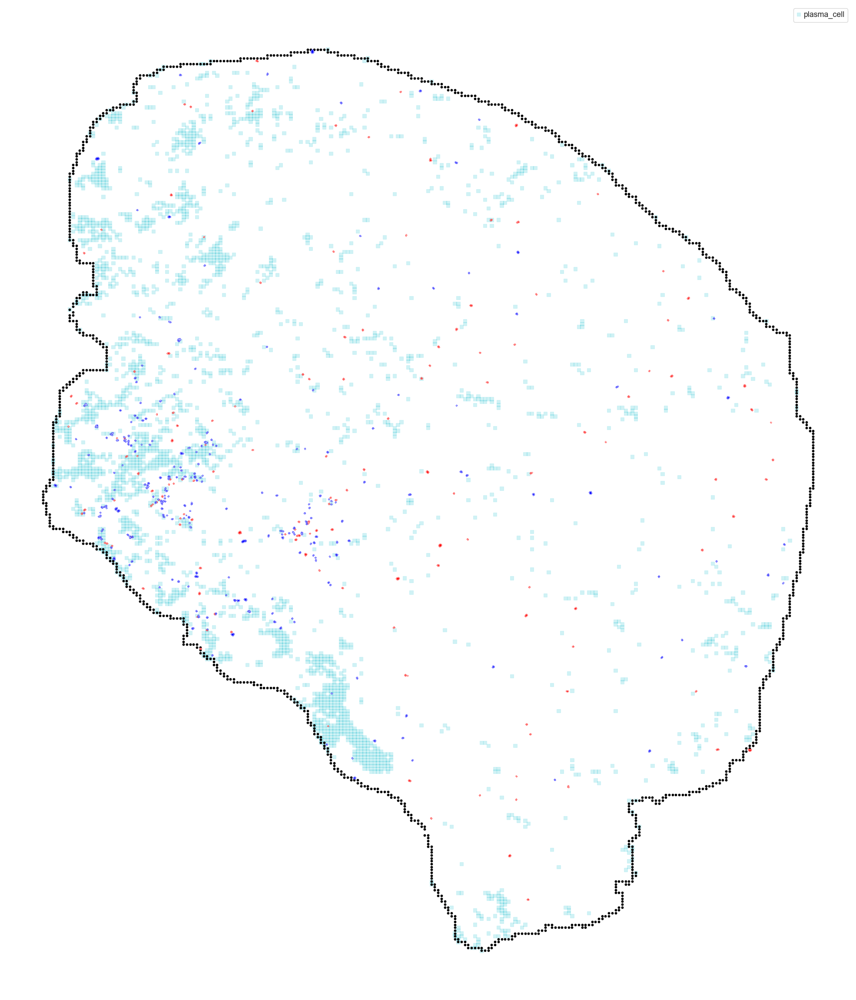

In [38]:
cellidslist = [ihga_cell_g,ihgg_cell_g]  # 
colors = ['red','blue']

hull = cellbin.uns['hull']
background = pd.DataFrame(rna.obsm['X_spatial'],columns = ['x','y'])
background['value'] = rna.obs['annotation2'].to_list()

background = background[background['value'] == 'plasma_cell']

fig,ax = plt.subplots(figsize = (25,30))

sns.scatterplot(x = background['x'],y = background['y'],hue = background['value'],marker='s' ,edgecolors=None,rasterized =True,alpha = 0.2,palette=anno_dict)
ax.scatter(hull[:,0],hull[:,1],edgecolors = None, color = 'black', s = 10,rasterized =True)


total_cells_plot = list(set([ m for i in cellidslist for m in i ]))
total_cellpose_df = cellbin.uns['cellpose']
total_outline_df = cellbin.uns['outline']

cellpose_df = total_cellpose_df[total_cellpose_df['cellID'].isin(total_cells_plot)]
outline_df = total_outline_df[total_outline_df['cellID'].isin(total_cells_plot)]


for cellids,color,outline_color in zip(cellidslist,colors,outline_colors):
    plotspot = cellpose_df[cellpose_df['cellID'].isin(cellids)]
    outlinespot = outline_df[outline_df['cellID'].isin(cellids)]
    ax.scatter(plotspot['x'],plotspot['y'],s = 0.01 ,color = color,edgecolors=None,rasterized =True,alpha = 0.3)
    sns.scatterplot(x = outlinespot['x'],y = outlinespot['y'],color = 'white',s = 0.09,edgecolors=None,rasterized =True,ax = ax)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.invert_yaxis()
ax.grid(False)
fig.savefig('./Fig3i.black.a2g_gremline.red_igha.blue_ighg.CVRGGHGNSWYESDYW.pdf')

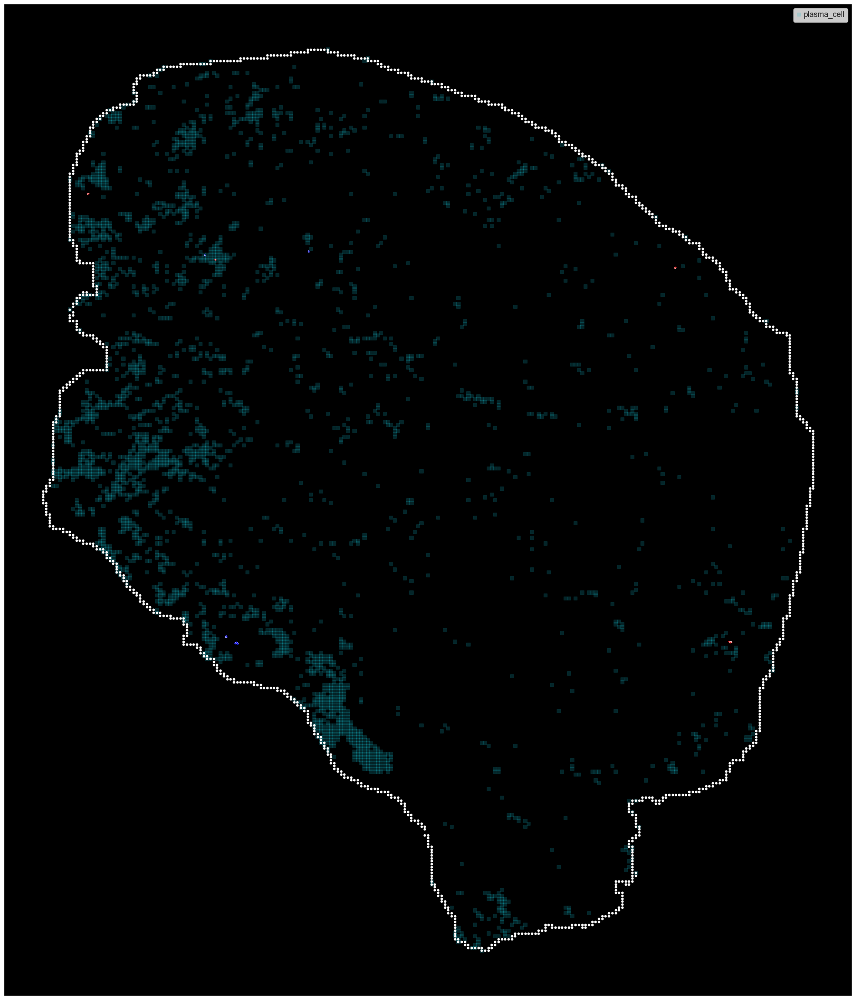

In [172]:
cellidslist = [ihga_cell_m,ihgg_cell_m]
colors = ['red','blue']

hull = cellbin.uns['hull']
background = pd.DataFrame(rna.obsm['X_spatial'],columns = ['x','y'])
background['value'] = rna.obs['annotation2'].to_list()

background = background[background['value'] == 'plasma_cell']

fig,ax = plt.subplots(figsize = (25,30))

sns.scatterplot(x = background['x'],y = background['y'],hue = background['value'],marker='s' ,edgecolors=None,rasterized =True,alpha = 0.2,palette=anno_dict)
ax.scatter(hull[:,0],hull[:,1],edgecolors = None, color = 'white', s = 10,rasterized =True)
ax.set_facecolor('black')


total_cells_plot = list(set([ m for i in cellidslist for m in i ]))
total_cellpose_df = cellbin.uns['cellpose']
total_outline_df = cellbin.uns['outline']

cellpose_df = total_cellpose_df[total_cellpose_df['cellID'].isin(total_cells_plot)]
outline_df = total_outline_df[total_outline_df['cellID'].isin(total_cells_plot)]


for cellids,color,outline_color in zip(cellidslist,colors,outline_colors):
    plotspot = cellpose_df[cellpose_df['cellID'].isin(cellids)]
    outlinespot = outline_df[outline_df['cellID'].isin(cellids)]
    ax.scatter(plotspot['x'],plotspot['y'],s = 0.01 ,color = color,edgecolors=None,rasterized =True,alpha = 0.3)
    sns.scatterplot(x = outlinespot['x'],y = outlinespot['y'],color = 'white',s = 0.09,edgecolors=None,rasterized =True,ax = ax)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.invert_yaxis()
ax.grid(False)
fig.savefig('./Fig3i.a2g_mutation.red_igha.blue_ighg.CVRGGHGNSWYESDYW.pdf')

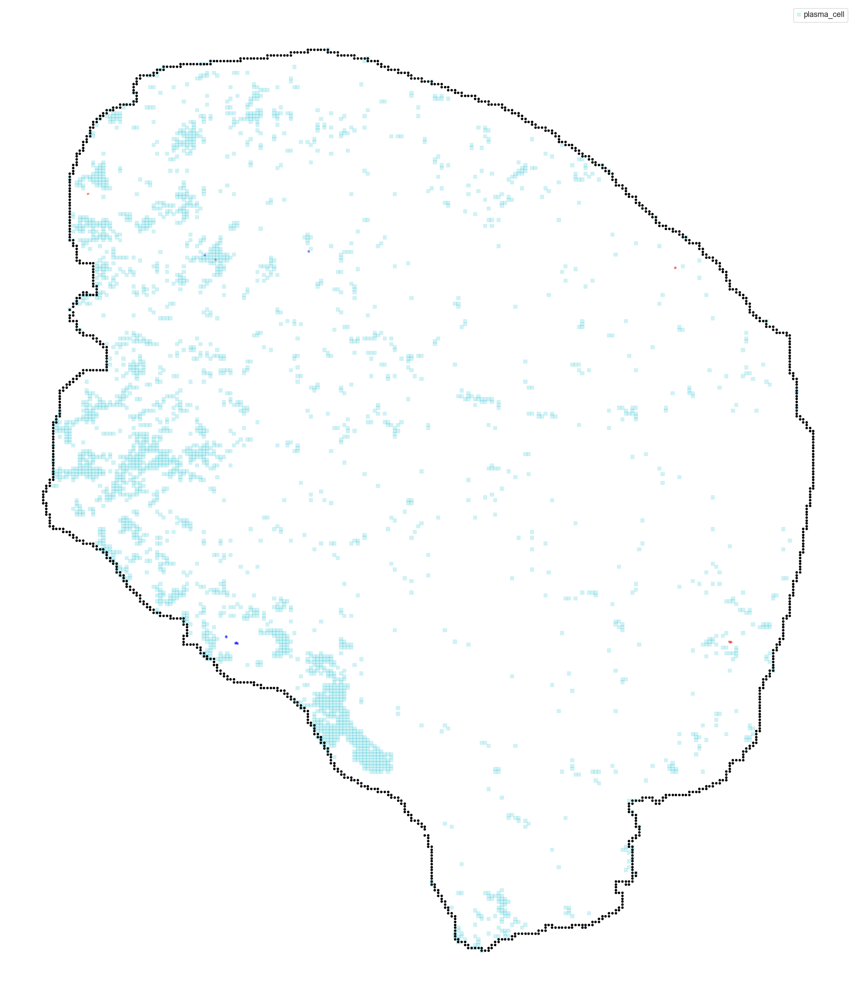

In [39]:
cellidslist = [ihga_cell_m,ihgg_cell_m]
colors = ['red','blue']

hull = cellbin.uns['hull']
background = pd.DataFrame(rna.obsm['X_spatial'],columns = ['x','y'])
background['value'] = rna.obs['annotation2'].to_list()

background = background[background['value'] == 'plasma_cell']

fig,ax = plt.subplots(figsize = (25,30))

sns.scatterplot(x = background['x'],y = background['y'],hue = background['value'],marker='s' ,edgecolors=None,rasterized =True,alpha = 0.2,palette=anno_dict)
ax.scatter(hull[:,0],hull[:,1],edgecolors = None, color = 'black', s = 10,rasterized =True)


total_cells_plot = list(set([ m for i in cellidslist for m in i ]))
total_cellpose_df = cellbin.uns['cellpose']
total_outline_df = cellbin.uns['outline']

cellpose_df = total_cellpose_df[total_cellpose_df['cellID'].isin(total_cells_plot)]
outline_df = total_outline_df[total_outline_df['cellID'].isin(total_cells_plot)]


for cellids,color,outline_color in zip(cellidslist,colors,outline_colors):
    plotspot = cellpose_df[cellpose_df['cellID'].isin(cellids)]
    outlinespot = outline_df[outline_df['cellID'].isin(cellids)]
    ax.scatter(plotspot['x'],plotspot['y'],s = 0.01 ,color = color,edgecolors=None,rasterized =True,alpha = 0.3)
    sns.scatterplot(x = outlinespot['x'],y = outlinespot['y'],color = 'white',s = 0.09,edgecolors=None,rasterized =True,ax = ax)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.invert_yaxis()
ax.grid(False)
fig.savefig('./Fig3i.black.a2g_mutation.red_igha.blue_ighg.CVRGGHGNSWYESDYW.pdf')

In [175]:
tls4clone = spaxcr.tl.clonestat(cellbin[cellbin.obs['tls_cluster'] == '4'], chains = 'IGH')

In [176]:
def query(adata,cdr3):
    csr = adata[:,cdr3].X
    non_zero_indices = np.nonzero(csr)[0]
    obs_with_value = adata.obs_names[non_zero_indices]
    return list(obs_with_value)

In [36]:
# background = pd.DataFrame(rna.obsm['X_spatial'],columns = ['x','y'])
# background['value'] = rna.obs['annotation2'].map(dict(Counter(total))).tolist()

In [177]:
tls4clone['mutation'] = tls4clone['CDR3'].map(mutationdict)

In [178]:
tls4clone['mutation'].value_counts()   #CDR3

mutation
germline    37
mutated     20
Name: count, dtype: int64

In [179]:
mutationcell = []
for cdr3 in tls4clone[tls4clone['mutation'] == 'mutated']['CDR3']:
    mutationcell.extend(query(cellbin,cdr3))
mutationcell = set(mutationcell)

In [180]:
germlinecell = []
for cdr3 in tls4clone[tls4clone['mutation'] == 'germline']['CDR3']:
    germlinecell.extend(query(cellbin,cdr3))
germlinecell = set(germlinecell)

In [181]:
# total tls4 clone
combine_cellbin_binadata(cellbin,rna,obs = 'annotation2',basis = 'X_spatial')
annodict = dict(zip(cellbin.obs_names,cellbin.obs['annotation2']))
mutationdict = dict(zip(cellbin.var_names,cellbin.var['BCRstatus']))

In [182]:
germlinecelldf = pd.DataFrame(germlinecell,columns = ['cell'])
germlinecelldf['type'] = 'ancestor'

mutationcelldf = pd.DataFrame(mutationcell,columns = ['cell'])
mutationcelldf['type'] = 'mutation'
totolcelldf = pd.concat([mutationcelldf,germlinecelldf])
totolcelldf['anno'] = totolcelldf['cell'].map(annodict)

In [183]:
percentage_df = totolcelldf.groupby(['anno', 'type']).size().unstack(fill_value=0)
# vc = cellbin.obs['annotation2'].value_counts()
# vc_count = dict(zip(vc.index,vc.values))
# percentage_df['total'] = percentage_df.index.map(vc_count)
# percentage_df['rest'] = percentage_df['total'] - percentage_df['ancestor'] - percentage_df['mutation'] 
# percentage_df = percentage_df[['ancestor','mutation','rest']].copy()
percentage_df = percentage_df.div(percentage_df.sum(axis=1), axis=0) * 100

In [184]:
percentage_df.index.name=None

In [940]:
# percentage_df.to_csv('./Main_figure/Fig2G.stat.csv')

/home/liuyi/miniconda3/envs/spatial/lib/python3.9/site-packages/seaborn/categorical.py:700: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  artists = ax.bxp(**boxplot_kws)


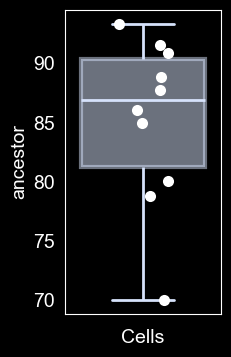

In [194]:
fig,ax = plt.subplots(figsize = (2,4))
fig.patch.set_facecolor('black')
ax.set_facecolor('black')

# vc[vc>100] =100
sns.boxplot(percentage_df['ancestor'], ax=ax, color='lightyellow', linewidth=3,
            boxprops=dict(facecolor='none', color='#D6E2FB',alpha = 0.5),
            whiskerprops=dict(color='#D6E2FB', linewidth=2),
            capprops=dict(color='#D6E2FB', linewidth=2),
            medianprops=dict(color='#D6E2FB', linewidth=2))
sns.stripplot(percentage_df['ancestor'],ax = ax,color = 'white',s = 8,jitter=0.2)
ax.grid(False)

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white')
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')
ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')
ax.yaxis.label.set_color('white')
ax.xaxis.label.set_color('white')
ax.title.set_color('white')
ax.set_xlabel('Cells')
# fig.savefig('./Main_figure//Fig3G.boxwhisker.pdf',bbox_inches = 'tight')
fig.savefig('./umi//Sup8g.Q25_9.7.Q75_18.8.median_13.2.pdf',bbox_inches = 'tight')

In [193]:
percentage_df['ancestor']

grouped =percentage_df['mutation']
summary = grouped.agg(
    Median=np.median,
    Q25=lambda x: x.quantile(0.25),
    Q75=lambda x: x.quantile(0.75)
)
summary

/tmp/ipykernel_3655051/1349470134.py:4: FutureWarning: The provided callable <function median at 0x7f58f81c84c0> is currently using Series.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
  summary = grouped.agg(


Median    13.156303
Q25        9.682458
Q75       18.765060
Name: mutation, dtype: float64

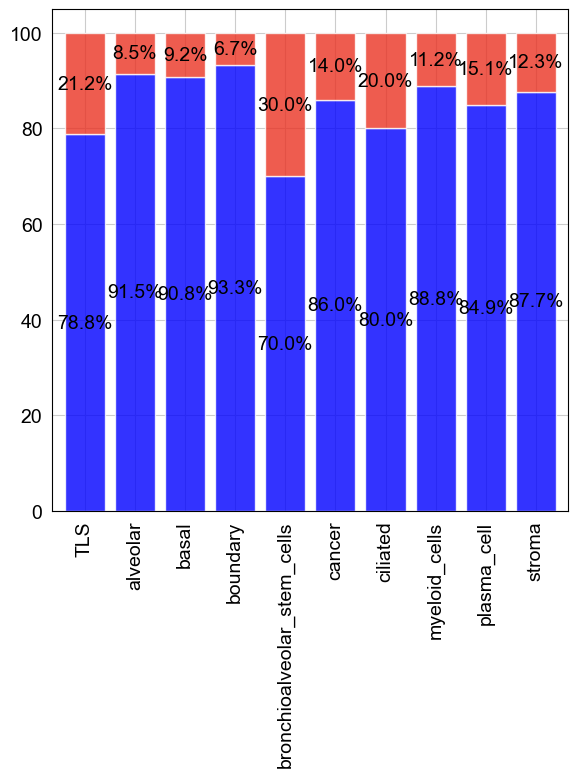

In [192]:
# fig = plt.figure(figsize=(6, 8))
# fig.patch.set_facecolor('black')

# gs = GridSpec(2, 1, height_ratios=[2, 1], hspace=0.1)

# ax1 = fig.add_subplot(gs[0])
# ax2 = fig.add_subplot(gs[1])
# ax1.set_facecolor('black')  
# ax2.set_facecolor('black')
fig,ax1 = plt.subplots(figsize = (6,8))
# fig.patch.set_facecolor('black')

percentage_df.plot(kind='bar', stacked=True, ax=ax1, color={'mutation': '#EA3323', 'ancestor': 'blue','rest':'grey'}, width=0.8,alpha = 0.8)
# percentage_df.plot(kind='bar', stacked=True, ax=ax2, color={'mutation': '#EA3323', 'ancestor': 'blue','rest':'grey'}, width=0.8,alpha = 0.8)
ax1.set_ylabel('')
# ax1.set_xticklabels([])
ax1.get_legend().remove()
# ax2.get_legend().remove()
# ax1.set_facecolor('black')  
# ax1.set_ylim(75, 100)
# ax2.set_ylim(0, 15)
# ax1.spines['bottom'].set_visible(False)
# ax2.spines['top'].set_visible(False)
# ax1.xaxis.tick_top()
# ax1.tick_params(labeltop=False)
# ax2.xaxis.tick_bottom()
# d = .015 
# kwargs = dict(transform=ax1.transAxes, color='white', clip_on=False)
# ax1.plot((-d, +d), (-d, +d), **kwargs)      
# ax1.plot((1 - d, 1 + d), (-d, +d), **kwargs)

# kwargs.update(transform=ax2.transAxes) 
# ax2.plot((-d, +d), (1 - d, 1 + d), **kwargs) 
# ax2.plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs)
for container in ax1.containers:
    ax1.bar_label(container, fmt='%.1f%%', label_type='center', color='black')

# for container in ax2.containers:
#     ax2.bar_label(container, fmt='%.1f%%', label_type='center', color='white')

# ax1.grid(False)
# ax2.grid(False)
# for ax in [ax1,]:
#     ax.spines['top'].set_color('white')
#     ax.spines['right'].set_color('white')
#     ax.spines['left'].set_color('white')
#     ax.spines['bottom'].set_color('white')
#     ax.tick_params(axis='x', colors='white')
#     ax.tick_params(axis='y', colors='white')
#     ax.yaxis.label.set_color('white')
#     ax.xaxis.label.set_color('white')
#     ax.title.set_color('white')
fig.tight_layout()
plt.savefig('./umi/Sup8g.pdf')
plt.show()

In [182]:
cellidslist = [mutationcell,germlinecell]
colors = ['#E84B50','#00A1DF']

In [185]:
import matplotlib.colors as mcolors
csr_count_dict = dict(Counter(total))
annotation2_counts = rna.obs['annotation2'].value_counts().to_dict()
division_result = {key: csr_count_dict[key]/annotation2_counts[key] for key in csr_count_dict if key in annotation2_counts}

In [188]:
division_result.pop('ciliated')
# division_result.pop('bronchioalveolar_stem_cells')
# division_result.pop('basal')

0.0038910505836575876

In [186]:
division_result

{'alveolar': 0.0007305669199298656,
 'TLS': 0.0012610340479192938,
 'cancer': 0.00021070375052675939,
 'plasma_cell': 0.0013192612137203166,
 'basal': 0.0015856236786469344,
 'boundary': 0.0005372492836676218,
 'stroma': 0.0008020854220974534,
 'myeloid_cells': 0.0008984725965858042,
 'bronchioalveolar_stem_cells': 0.0008223684210526315,
 'ciliated': 0.0038910505836575876}

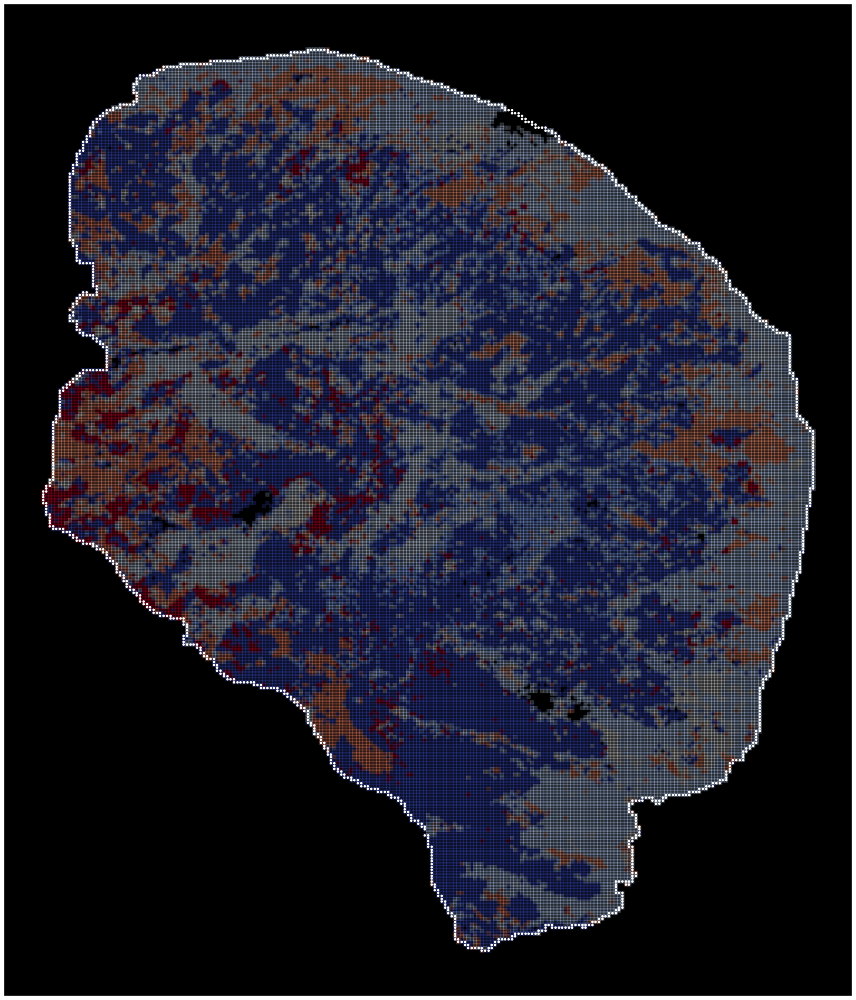

In [189]:
hull = cellbin.uns['hull']
background = pd.DataFrame(rna.obsm['X_spatial'],columns = ['x','y'])
background['value'] = rna.obs['annotation2'].map(division_result).tolist()
values = background['value']
# norm = mcolors.Normalize(vmin=min(values)*0.1, vmax=max(values) * 1.15)

fig,ax = plt.subplots(figsize = (25,30))
ax.scatter(background['x'],background['y'],c = background['value'],marker='s' ,edgecolors=None,rasterized =True,alpha = 0.2,cmap = 'coolwarm')#,norm=norm)
ax.scatter(hull[:,0],hull[:,1],edgecolors = None, color = 'white', s = 10,rasterized =True)
ax.set_facecolor('black')


# for cellids,color in zip(cellidslist,colors):
#     plotspot = cellbin.uns['cellpose'][cellbin.uns['cellpose']['cellID'].isin(cellids)]
#     outlinespot = cellbin.uns['outline'][cellbin.uns['outline']['cellID'].isin(cellids)]
#     ax.scatter(plotspot['x'],plotspot['y'],s = 0.01 ,color = color,edgecolors=None,rasterized =True,alpha = 0.3)
#     sns.scatterplot(x = outlinespot['x'],y = outlinespot['y'],color = 'white',s = 0.05,edgecolors=None,rasterized =True,ax = ax)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.invert_yaxis()
ax.grid(False)
# fig.savefig('./Main_figure/Figh.all.pdf')

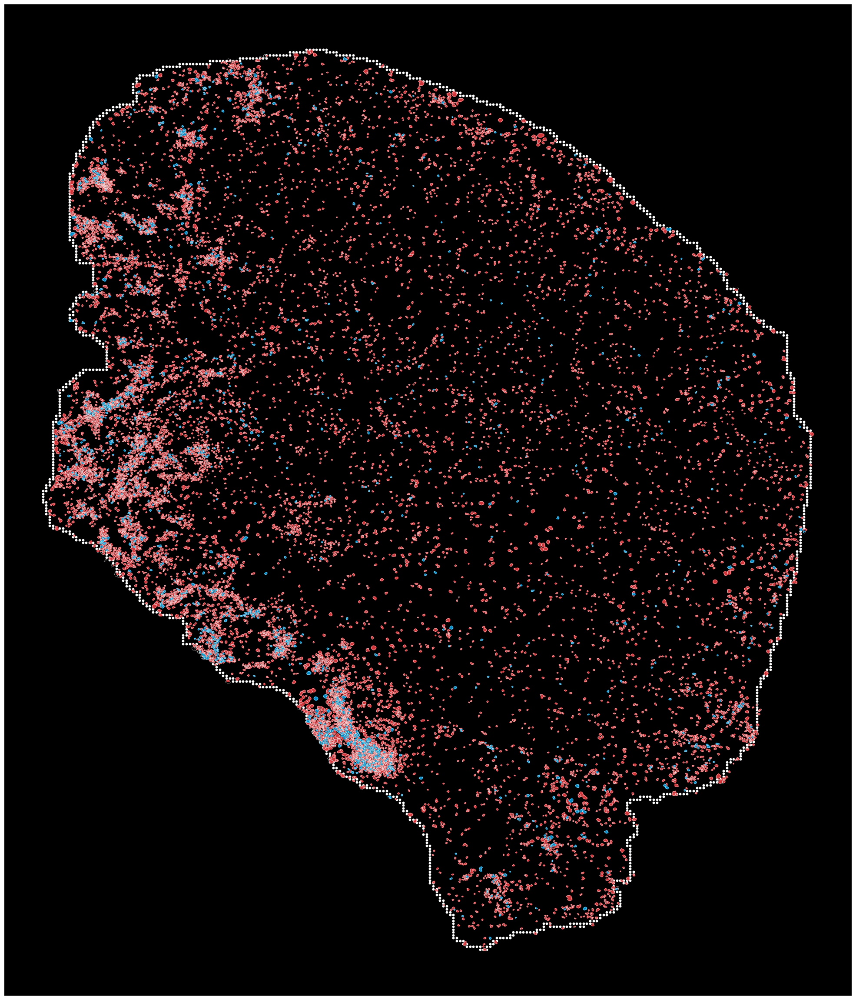

In [443]:
hull = cellbin.uns['hull']
background = pd.DataFrame(rna.obsm['X_spatial'],columns = ['x','y'])
background['value'] = rna.obs['annotation2'].map(dict(Counter(total))).tolist()

values = background['value']
norm = mcolors.Normalize(vmin=min(values)*0.1, vmax=max(values) * 1.15)

fig,ax = plt.subplots(figsize = (25,30))
# ax.scatter(background['x'],background['y'],c = background['value'],marker='s' ,edgecolors=None,rasterized =True,alpha = 0.5,cmap = 'cividis',norm=norm)
ax.scatter(hull[:,0],hull[:,1],edgecolors = None, color = 'white', s = 10,rasterized =True)
ax.set_facecolor('black')


for cellids,color in zip(cellidslist,colors):
    plotspot = cellbin.uns['cellpose'][cellbin.uns['cellpose']['cellID'].isin(cellids)]
    outlinespot = cellbin.uns['outline'][cellbin.uns['outline']['cellID'].isin(cellids)]
    ax.scatter(plotspot['x'],plotspot['y'],s = 0.01 ,color = color,edgecolors=None,rasterized =True,alpha = 0.3)
    sns.scatterplot(x = outlinespot['x'],y = outlinespot['y'],color = 'white',s = 0.05,edgecolors=None,rasterized =True,ax = ax)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.invert_yaxis()
ax.grid(False)
fig.savefig('./Main_figure/Figh.cells.pdf')

In [884]:
cells1 = cellbin[cellbin.obs['annotation2'] == 'TLS'].obs_names
cells2 = cellbin[cellbin.obs['annotation2'] == 'plasma_cell'].obs_names

In [906]:
cellidslist = [cells1,cells2]
colors = ['red','blue']

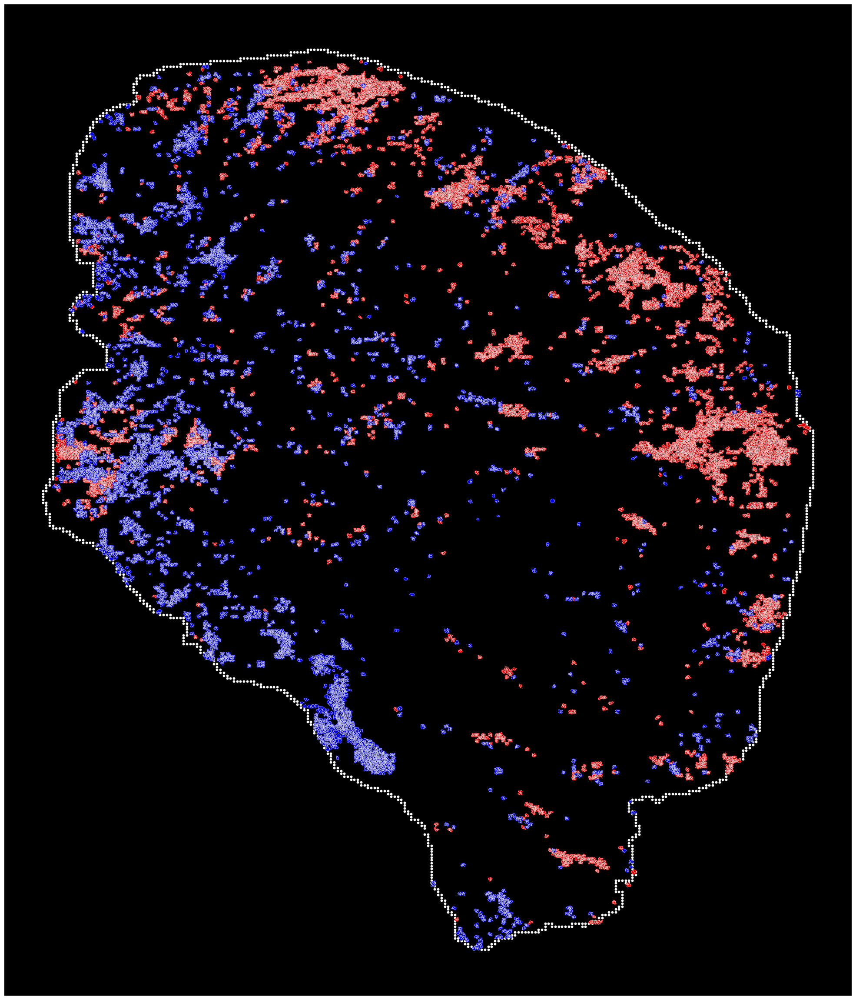

In [907]:
hull = cellbin.uns['hull']
background = pd.DataFrame(rna.obsm['X_spatial'],columns = ['x','y'])
background['value'] = rna.obs['annotation2'].map(dict(Counter(total))).tolist()

values = background['value']
norm = mcolors.Normalize(vmin=min(values)*0.1, vmax=max(values) * 1.15)

fig,ax = plt.subplots(figsize = (25,30))
ax.scatter(background['x'],background['y'],c = background['value'],marker='s' ,edgecolors=None,rasterized =True,alpha = 0.8,)
ax.scatter(hull[:,0],hull[:,1],edgecolors = None, color = 'white', s = 10,rasterized =True)
ax.set_facecolor('black')


for cellids,color in zip(cellidslist,colors):
    plotspot = cellbin.uns['cellpose'][cellbin.uns['cellpose']['cellID'].isin(cellids)]
    outlinespot = cellbin.uns['outline'][cellbin.uns['outline']['cellID'].isin(cellids)]
    ax.scatter(plotspot['x'],plotspot['y'],s = 0.01 ,color = color,edgecolors=None,rasterized =True,alpha = 0.1)
    sns.scatterplot(x = outlinespot['x'],y = outlinespot['y'],color = 'white',s = 0.05,edgecolors=None,rasterized =True,ax = ax)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.invert_yaxis()
ax.grid(False)
fig.savefig('./tmp.cells.pdf')

In [908]:
cellidslist = [mutationcell,germlinecell]
colors = ['#E84B50','#00A1DF']

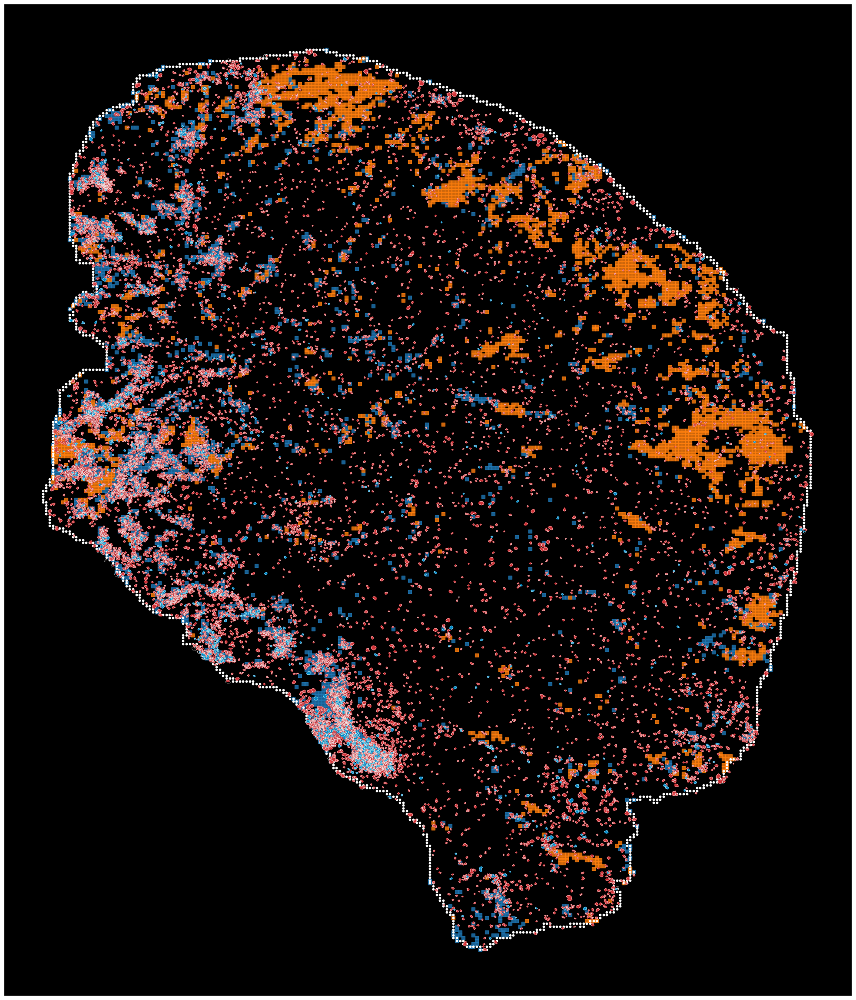

In [909]:
cellidslist = [mutationcell,germlinecell]
colors = ['#E84B50','#00A1DF']
hull = cellbin.uns['hull']
background = pd.DataFrame(rna.obsm['X_spatial'],columns = ['x','y'])
background['value'] = rna.obs['annotation2'].to_list()
background_1 = background[background['value'].map(lambda x : x == 'plasma_cell')]
background_2 = background[background['value'].map(lambda x : x == 'TLS')]


fig,ax = plt.subplots(figsize = (25,30))


ax.scatter(background_1['x'],background_1['y'],marker='s' ,edgecolors=None,rasterized =True,alpha = 0.8)

ax.scatter(background_2['x'],background_2['y'],marker='s' ,edgecolors=None,rasterized =True,alpha = 0.8)

ax.scatter(hull[:,0],hull[:,1],edgecolors = None, color = 'white', s = 10,rasterized =True)
ax.set_facecolor('black')


for cellids,color in zip(cellidslist,colors):
    plotspot = cellbin.uns['cellpose'][cellbin.uns['cellpose']['cellID'].isin(cellids)]
    outlinespot = cellbin.uns['outline'][cellbin.uns['outline']['cellID'].isin(cellids)]
    ax.scatter(plotspot['x'],plotspot['y'],s = 0.01 ,color = color,edgecolors=None,rasterized =True,alpha = 0.3)
    sns.scatterplot(x = outlinespot['x'],y = outlinespot['y'],color = 'white',s = 0.05,edgecolors=None,rasterized =True,ax = ax)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.invert_yaxis()
ax.grid(False)
fig.savefig('./tmp.tmp.pdf')

In [3]:
rna = sc.read_h5ad('/storage/liuyi/09.ma_tcr/data_precoess/p7/m15_A0.clone.h5ad')

# sup 6

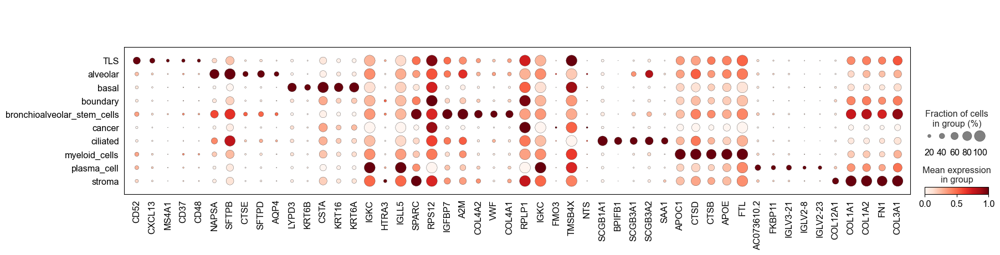

In [728]:
gene_list = ["CD52", "CXCL13", "MS4A1", "CD37", "CD48", "NAPSA", "SFTPB", "CTSE", "SFTPD", "AQP4", "LYPD3", "KRT6B", "CSTA", "KRT16", "KRT6A", "IGKC", "HTRA3", "IGLL5", "SPARC", "RPS12", "IGFBP7", "A2M", "COL4A2", "VWF", "COL4A1", "RPLP1", "IGKC", "FMO3", "TMSB4X", "NTS", "SCGB1A1", "BPIFB1", "SCGB3A1", "SCGB3A2", "SAA1", "APOC1", "CTSD", "CTSB", "APOE", "FTL", "AC073610.2", "FKBP11", "IGLV3-21", "IGLV2-8", "IGLV2-23", "COL12A1", "COL1A1", "COL1A2", "FN1", "COL3A1"]

sc.pl.dotplot(rna,gene_list,groupby = 'annotation2',standard_scale='var',save = 'sup6a.pdf')

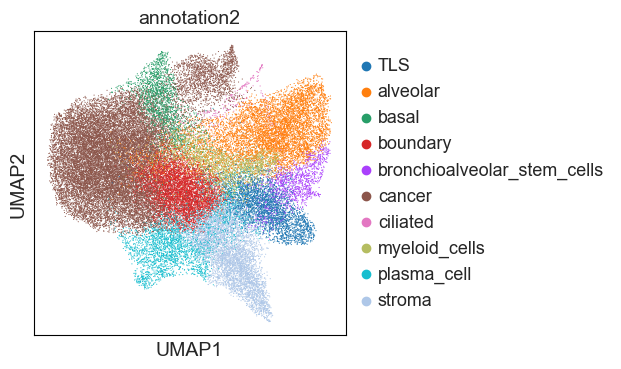

In [723]:
sc.pl.umap(rna,color = 'annotation2')

In [2]:
import scanpy as sc
rna = sc.read_h5ad('/storage/liuyi/09.ma_tcr/data_precoess/p7/m15_A0.clone.h5ad')
rna

AnnData object with n_obs × n_vars = 48194 × 4766
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'annotation', 'annotation2', 'weights.alveolar_cell', 'weights.b_cell', 'weights.cancer_cell', 'weights.ciliated_cells', 'weights.endothelial_cell', 'weights.fDC', 'weights.fibroblast', 'weights.mast_cell', 'weights.monocytes', 'weights.myeloid_cell', 'weights.neutrophil', 'weights.plasma_cell', 'weights.t_cell', 'IGHA', 'IGHAClone', 'IGHACloneNum', 'IGHACloneDetail', 'IGHG', 'IGHGClone', 'IGHGCloneNum', 'IGHGCloneDetail', 'IGHM', 'IGHMClone', 'IGHMCloneNum', 'IGHMCloneDetail', 'IGK', 'IGKClone', 'IGKCloneNum', 'IGKCloneDetail', 'IGL', 'IGLClone', 'IGLCloneNum', 'IGLCloneDetail', 'TRA', 'TRAClone', 'TRACloneNum', 'TRACloneDetail', 'TRB', 'TRBClone', 'TRBCloneNum', 'TRBCloneDetail'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means

In [7]:
import pandas as pd
weight = pd.read_csv('./weights_output.csv',index_col = 0)

In [ ]:
rna.obs[f'weights.{column}']

In [12]:
plot_list = []
for column in weight.columns:
    rna.obs[f'weights.{column}'] = weight[column]
    plot_list.append(f'weights.{column}')

In [14]:
plot_list = [
 'weights.alveolar_cell',
 'weights.b_cell',
 'weights.cancer_cell',
 'weights.ciliated_cells',
 'weights.DC',
 'weights.endothelial_cell',
 'weights.fibroblast',
 'weights.macrophage',
 'weights.mast_cell',
 'weights.monocytes',
 'weights.neutrophil',
 'weights.plasma_cell',
 'weights.t_cell']

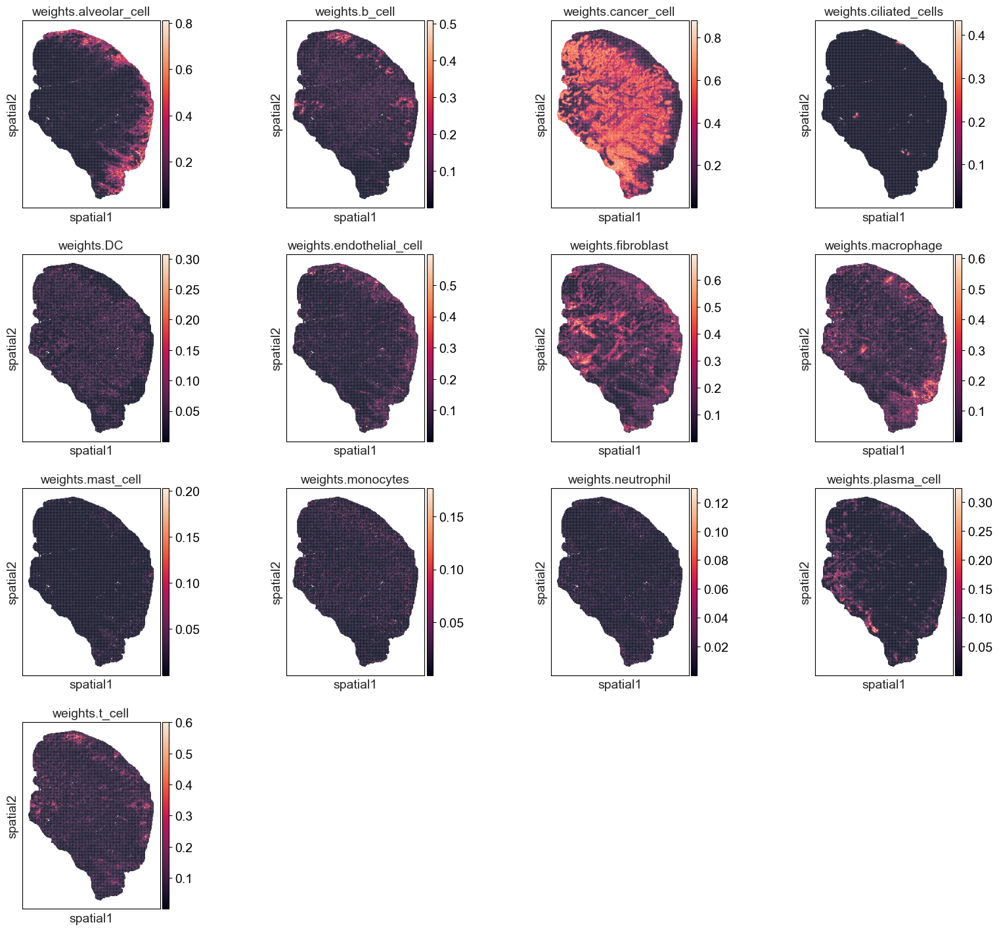

In [17]:
sc.pl.spatial(rna,color = plot_list,spot_size = 65,save='sup6d.pdf')

In [18]:
presenteage = rna.obs[plot_list+['annotation2']]

In [19]:
presenteage = presenteage.groupby('annotation2').mean()

/tmp/ipykernel_504845/4165962064.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  presenteage = presenteage.groupby('annotation2').mean()


In [20]:
presenteage = presenteage.divide(np.sum(presenteage,axis = 1),axis = 0)

In [21]:
rna.obs[plot_list+['annotation2']]

,weights.alveolar_cell,weights.b_cell,weights.cancer_cell,weights.ciliated_cells,weights.DC,weights.endothelial_cell,weights.fibroblast,weights.macrophage,weights.mast_cell,weights.monocytes,weights.neutrophil,weights.plasma_cell,weights.t_cell,annotation2
DNB_10000_10000,0.000088,0.060559,0.527688,0.000088,0.013359,0.000088,0.050569,0.076568,0.000088,0.000306,0.000088,0.003548,0.000088,cancer
DNB_10000_10050,0.028597,0.000125,0.468428,0.000125,0.000125,0.028096,0.027092,0.066037,0.000125,0.000125,0.010274,0.004035,0.047751,cancer
DNB_10000_10100,0.023993,0.000125,0.447100,0.000125,0.028534,0.063044,0.066037,0.023332,0.000125,0.000125,0.000125,0.002518,0.017838,cancer
DNB_10000_10150,0.006272,0.045340,0.592234,0.000061,0.014932,0.031187,0.028506,0.024900,0.000061,0.000061,0.000725,0.001548,0.000061,cancer
DNB_10000_10200,0.036477,0.000088,0.532966,0.000088,0.010559,0.000088,0.032835,0.015091,0.000088,0.033880,0.010777,0.004243,0.046648,basal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DNB_9950_9750,0.047539,0.000088,0.540069,0.000088,0.088936,0.003050,0.032694,0.051997,0.000088,0.001019,0.000088,0.002215,0.021884,cancer
DNB_9950_9800,0.019130,0.044594,0.425801,0.000179,0.010463,0.031831,0.042265,0.020168,0.019209,0.012788,0.000179,0.001855,0.000179,cancer
DNB_9950_9850,0.044892,0.015282,0.531450,0.000088,0.004155,0.014324,0.017628,0.015686,0.000088,0.010444,0.000088,0.001137,0.055783,cancer
DNB_9950_9900,0.032203,0.001313,0.547918,0.006195,0.065834,0.020482,0.028091,0.007695,0.000088,0.000088,0.000088,0.002013,0.036854,cancer


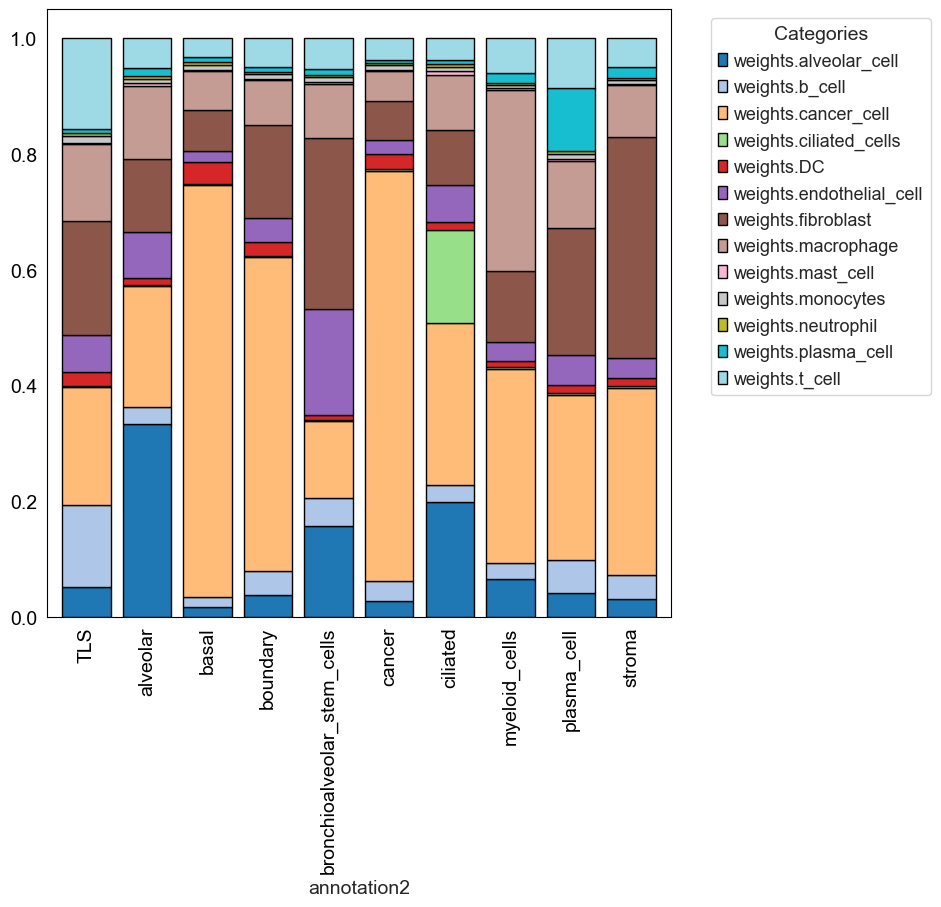

In [22]:
ax = presenteage.plot(kind='bar', stacked=True, figsize=(8, 8), cmap="tab20",width = 0.8,edgecolor = 'black')
plt.legend(title="Categories", bbox_to_anchor=(1.05, 1), loc='upper left')
ax.grid()
plt.savefig('./figures/sup6e.pbar.pdf',bbox_inches = 'tight')
presenteage.to_csv('./figures/sup6.pbar.csv')

In [23]:
presenteage = rna.obs[plot_list+['annotation2']]
presenteage

,weights.alveolar_cell,weights.b_cell,weights.cancer_cell,weights.ciliated_cells,weights.DC,weights.endothelial_cell,weights.fibroblast,weights.macrophage,weights.mast_cell,weights.monocytes,weights.neutrophil,weights.plasma_cell,weights.t_cell,annotation2
DNB_10000_10000,0.000088,0.060559,0.527688,0.000088,0.013359,0.000088,0.050569,0.076568,0.000088,0.000306,0.000088,0.003548,0.000088,cancer
DNB_10000_10050,0.028597,0.000125,0.468428,0.000125,0.000125,0.028096,0.027092,0.066037,0.000125,0.000125,0.010274,0.004035,0.047751,cancer
DNB_10000_10100,0.023993,0.000125,0.447100,0.000125,0.028534,0.063044,0.066037,0.023332,0.000125,0.000125,0.000125,0.002518,0.017838,cancer
DNB_10000_10150,0.006272,0.045340,0.592234,0.000061,0.014932,0.031187,0.028506,0.024900,0.000061,0.000061,0.000725,0.001548,0.000061,cancer
DNB_10000_10200,0.036477,0.000088,0.532966,0.000088,0.010559,0.000088,0.032835,0.015091,0.000088,0.033880,0.010777,0.004243,0.046648,basal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DNB_9950_9750,0.047539,0.000088,0.540069,0.000088,0.088936,0.003050,0.032694,0.051997,0.000088,0.001019,0.000088,0.002215,0.021884,cancer
DNB_9950_9800,0.019130,0.044594,0.425801,0.000179,0.010463,0.031831,0.042265,0.020168,0.019209,0.012788,0.000179,0.001855,0.000179,cancer
DNB_9950_9850,0.044892,0.015282,0.531450,0.000088,0.004155,0.014324,0.017628,0.015686,0.000088,0.010444,0.000088,0.001137,0.055783,cancer
DNB_9950_9900,0.032203,0.001313,0.547918,0.006195,0.065834,0.020482,0.028091,0.007695,0.000088,0.000088,0.000088,0.002013,0.036854,cancer


In [24]:
cellsum = np.sum(presenteage.iloc[:,:-1],axis = 0)

In [25]:
presenteage = presenteage.groupby('annotation2').sum()

/tmp/ipykernel_504845/2159595421.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  presenteage = presenteage.groupby('annotation2').sum()


In [26]:
presenteage = presenteage.divide(cellsum,axis = 1)

In [27]:
presenteage = presenteage.T

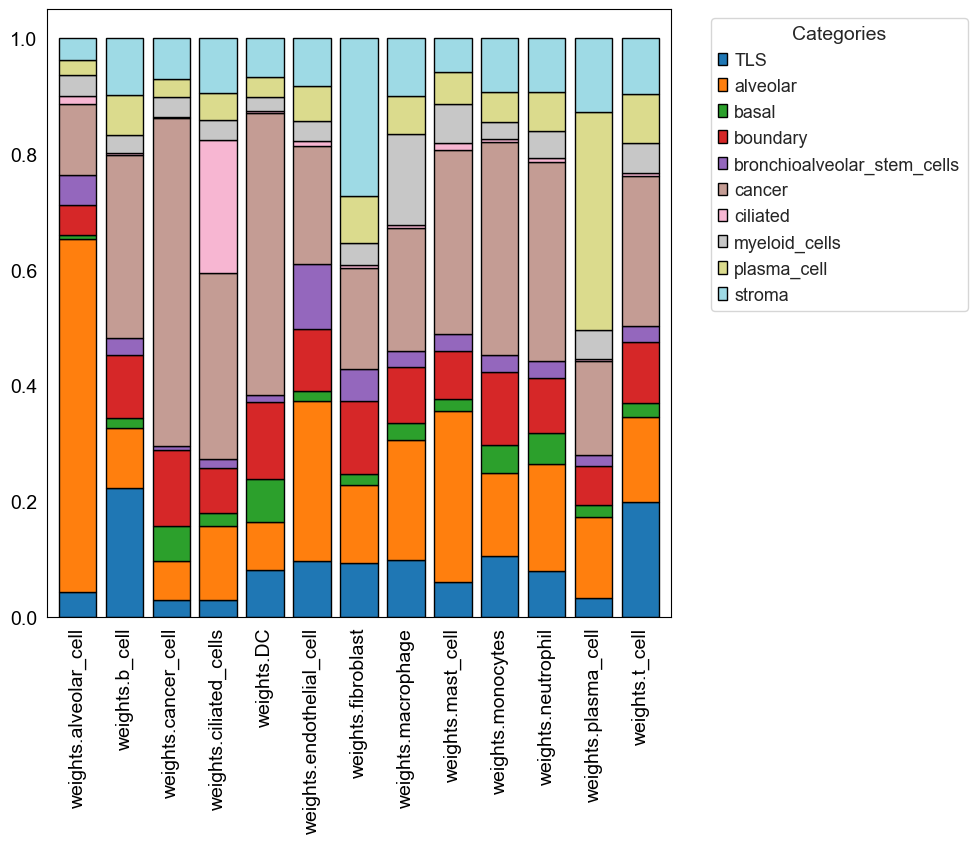

In [28]:
ax = presenteage.plot(kind='bar', stacked=True, figsize=(8, 8), cmap="tab20",width = 0.8,edgecolor = 'black')
plt.legend(title="Categories", bbox_to_anchor=(1.05, 1), loc='upper left')
ax.grid()
plt.savefig('./figures/sup6e.location.pdf',bbox_inches = 'tight')

<Axes: xlabel='annotation2'>

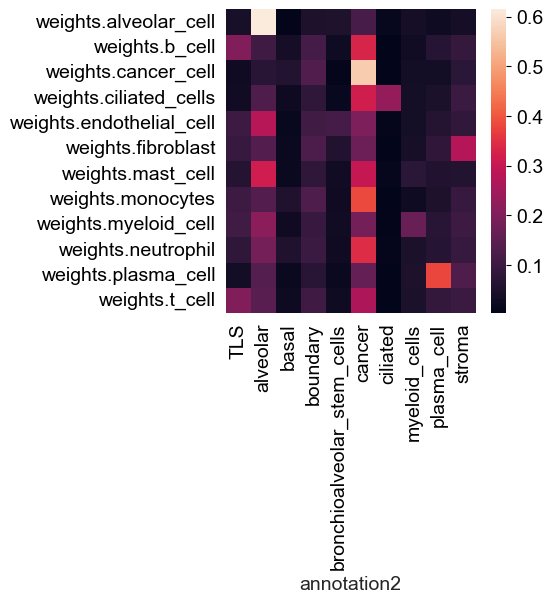

In [816]:
sns.heatmap(presenteage,)

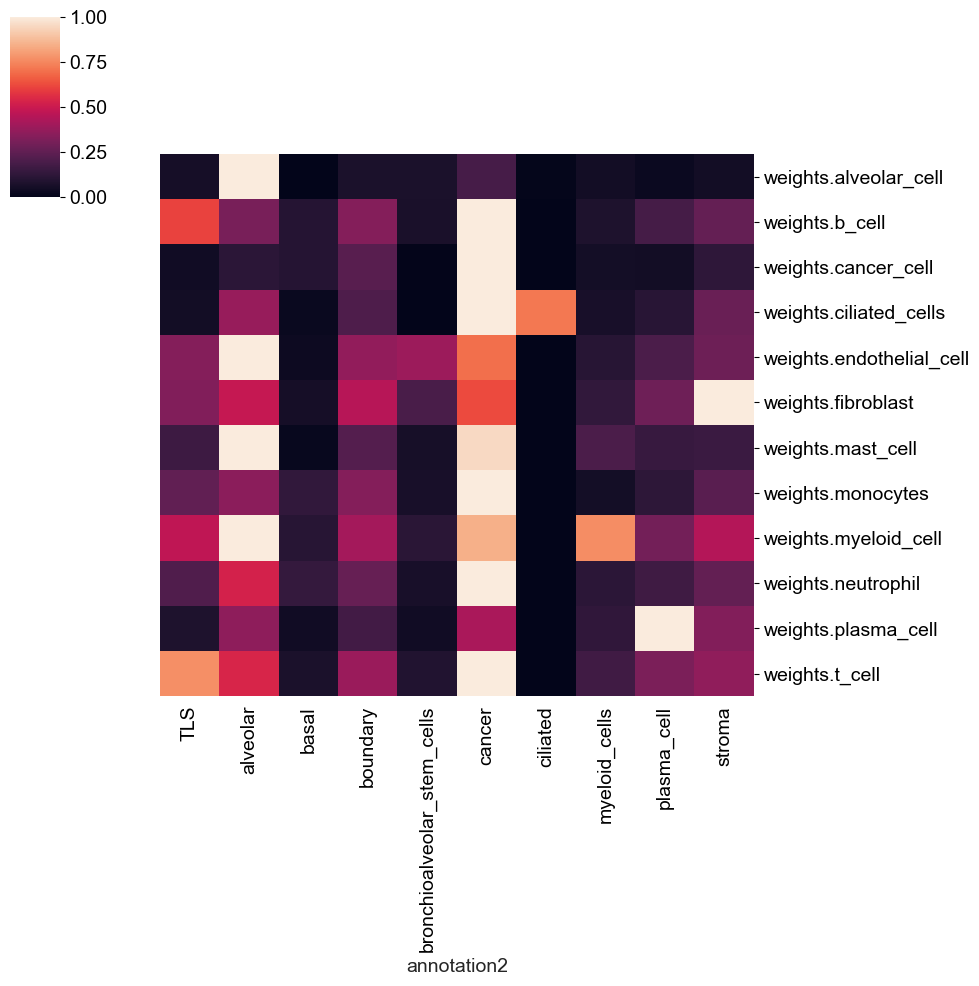

In [827]:
sns.clustermap(presenteage,standard_scale= 0,row_cluster=False,col_cluster=False)  

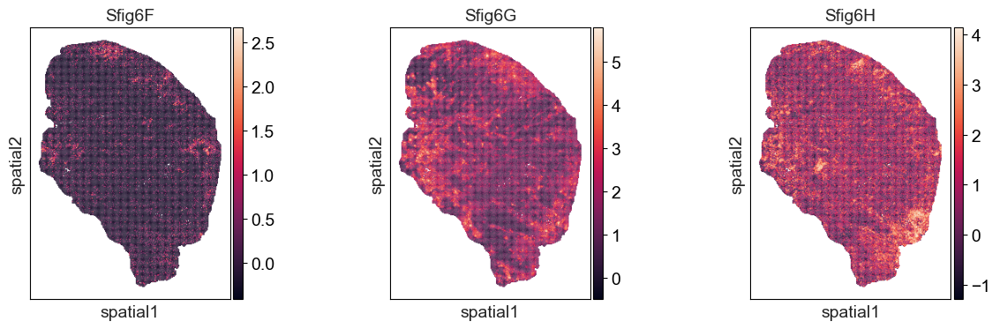

In [774]:
sc.tl.score_genes(rna,['CD3E','CXCL13','MS4A1'],score_name='Sfig6F')
sc.tl.score_genes(rna,['IGKC','IGLC7','JCHAIN'],score_name='Sfig6G')
sc.tl.score_genes(rna,['APOC1','LYZ','APOE'],score_name='Sfig6H')

sc.pl.spatial(rna,color = ['Sfig6F','Sfig6G','Sfig6H'],spot_size = 65,save = 'Sfig6f-h.pdf')